In [1]:
import pandas as pd
import numpy as np
import optuna
from optuna.visualization import plot_param_importances, plot_optimization_history
import shap
import pickle
import gower
from catboost import CatBoostClassifier, Pool

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score, f1_score, roc_auc_score, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
from scripts import Preprocessor, print_metrics
%matplotlib inline

In [2]:
p = Preprocessor('data_2')

In [3]:
dataframes = p.get_dataframes()

In [4]:
X_train, X_val, X_test, y_train, y_val, y_test, X_train_all, X_val_all, X_test_all = p.get_predictions_dataframe()

In [5]:
# X_train.drop(columns=['number_of_offers'], inplace=True)
# X_val.drop(columns=['number_of_offers'], inplace=True)
# X_test.drop(columns=['number_of_offers'], inplace=True)

In [6]:
# profile = ProfileReport(X_train, title="Predictions")
# profile.to_file("Predictions_profile.html")

In [27]:
model = CatBoostClassifier(iterations=10,
                           depth=7,
                           learning_rate=1,
                           loss_function='Logloss',
                           verbose=True,
                           cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# train the model
model.fit(X_train, y_train)
model.score(X_val, y_val.astype("str"))

0:	learn: 0.4162027	total: 36.4ms	remaining: 328ms
1:	learn: 0.3762623	total: 70.7ms	remaining: 283ms
2:	learn: 0.3570756	total: 109ms	remaining: 255ms
3:	learn: 0.3486107	total: 146ms	remaining: 219ms
4:	learn: 0.3451622	total: 188ms	remaining: 188ms
5:	learn: 0.3407750	total: 227ms	remaining: 151ms
6:	learn: 0.3395590	total: 267ms	remaining: 114ms
7:	learn: 0.3387829	total: 303ms	remaining: 75.9ms
8:	learn: 0.3371512	total: 341ms	remaining: 37.9ms
9:	learn: 0.3362238	total: 397ms	remaining: 0us


0.7588674876328807

Balanced accuracy: 0.7536513363164374
F1 score micro: 0.7588674876328807
F1 score macro: 0.752465061467483
RocAuc score: 0.832958581247276
Confusion matrix:


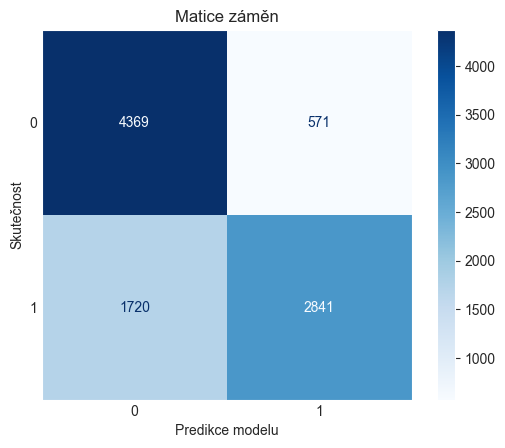

In [28]:
print_metrics(model, X_val, y_val)

In [10]:
importances = model.get_feature_importance()
feature_importances = pd.Series(importances, index=X_val.columns).sort_values(ascending=False)
feature_importances

number_of_offers               40.295323
total_wins                     33.632103
total_offers                   19.640545
type                            1.333292
publication_close_interval      0.997300
is_withdrawn                    0.832732
total_procurements              0.762028
bids_close_interval             0.741533
place_of_performance            0.585885
num_of_nan                      0.436031
is_association_of_suppliers     0.302193
distance                        0.225992
type_of_procedure               0.142661
is_rejected_due_too_low         0.070513
public_contract_regime          0.001871
dtype: float64

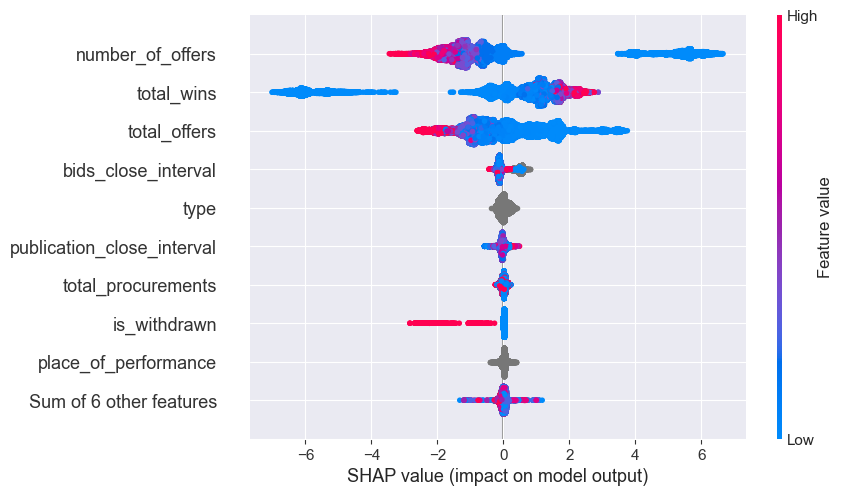

In [11]:
explainer = shap.Explainer(model)
shap_values = explainer(X_train)
plt.close('all')
shap.initjs()
shap.plots.beeswarm(shap_values)
#shap.plots.bar(shap_values)

In [12]:
feature_names = list(X_train.columns)

In [160]:
# from catboost import Pool
# train_pool = Pool(X_train, y_train, feature_names=feature_names, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# val_pool = Pool(X_val, y_val, feature_names=feature_names, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# model = CatBoostClassifier(iterations=25,
#                            depth=7,
#                            learning_rate=1,
#                            loss_function='Logloss',
#                            verbose=True,
#                            cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# summary = model.select_features(
#     train_pool,
#     eval_set=val_pool,
#     steps=3,
#     train_final_model=True,
#     logging_level='Silent',
#     features_for_select=feature_names,
#     num_features_to_select=4,
#     plot=True
# )
# predictions = model.predict(X_val)
# ba = balanced_accuracy_score(y_val.astype("str"), predictions)
# f1_micro = f1_score(y_val.astype("str"), predictions, average="micro")
# f1_macro = f1_score(y_val.astype("str"), predictions, average="macro")
# ra = roc_auc_score(y_val.astype("str"), model.predict_proba(X_val)[:,1])
# print(f"Balanced accuracy: {ba}")
# print(f"F1 score micro: {f1_micro}")
# print(f"F1 score macro: {f1_macro}")
# print(f"RocAuc score: {ra}")
# print("Confusion matrix:")
# display(confusion_matrix(y_val.astype("str"), predictions))

In [13]:
def objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 5, 500),
        "depth": trial.suggest_int("depth", 1, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.1, log=True),
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.25, 1), # 16 parametrů - min. 4
        "has_time": True,
        "objective": trial.suggest_categorical("objective", ["Logloss", "MultiClass"]),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-4, 100, log=True),
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
    }
    if params["bootstrap_type"] == "Bayesian":
        params["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif params["bootstrap_type"] == "Bernoulli":
        params["subsample"] = trial.suggest_float("subsample", 0.1, 1, log=True)
    model = CatBoostClassifier(**params, silent=True)
    model.fit(X_train, y_train, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
    predictions = model.predict(X_val)
    return balanced_accuracy_score(y_val.astype("str"), predictions)


In [14]:
study = optuna.create_study(study_name="CatBoost_final", direction="maximize")
study.optimize(objective, n_trials=100)

[I 2024-04-27 17:14:48,994] A new study created in memory with name: CatBoost_final
[I 2024-04-27 17:15:05,324] Trial 0 finished with value: 0.799088025834238 and parameters: {'iterations': 333, 'depth': 5, 'learning_rate': 0.006853817205622881, 'colsample_bylevel': 0.7214996290490766, 'objective': 'Logloss', 'l2_leaf_reg': 18.47470438158982, 'bootstrap_type': 'MVS'}. Best is trial 0 with value: 0.799088025834238.
[I 2024-04-27 17:15:15,988] Trial 1 finished with value: 0.7778288819040501 and parameters: {'iterations': 253, 'depth': 6, 'learning_rate': 0.09613779424700267, 'colsample_bylevel': 0.9633717881393433, 'objective': 'Logloss', 'l2_leaf_reg': 0.00014326150979474705, 'bootstrap_type': 'Bernoulli', 'subsample': 0.29896759440770854}. Best is trial 0 with value: 0.799088025834238.
[I 2024-04-27 17:15:28,618] Trial 2 finished with value: 0.7812023164179316 and parameters: {'iterations': 405, 'depth': 6, 'learning_rate': 0.015015784654340022, 'colsample_bylevel': 0.26969767249932247

In [25]:
# with open("catboost_study_final.pkl", "wb") as f:
#     pickle.dump(study, f)
with open("catboost_study_best.pkl", "rb") as f:
    study = pickle.load(f)

FileNotFoundError: [Errno 2] No such file or directory: 'catboost_study_best.pkl'

In [26]:
trial = study.best_trial
print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))

  Value:  0.8068354429798237
  Params: 
    depth: 7
    learning_rate: 0.004729152880135863
    colsample_bylevel: 0.9989903384828693
    objective: MultiClass
    l2_leaf_reg: 0.00010283846028207608
    bootstrap_type: Bayesian
    bagging_temperature: 7.207223020940942


In [17]:
# model = CatBoostClassifier(**trial.params, verbose=True, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# model.fit(X_train, y_train)
# 
# model.save_model("catboost_model_best_2")

0:	learn: 0.6821420	total: 36ms	remaining: 9.22s
1:	learn: 0.6696606	total: 69.6ms	remaining: 8.87s
2:	learn: 0.6605882	total: 104ms	remaining: 8.84s
3:	learn: 0.6494326	total: 144ms	remaining: 9.13s
4:	learn: 0.6395313	total: 191ms	remaining: 9.63s
5:	learn: 0.6310678	total: 230ms	remaining: 9.62s
6:	learn: 0.6222663	total: 271ms	remaining: 9.69s
7:	learn: 0.6124225	total: 312ms	remaining: 9.7s
8:	learn: 0.6032906	total: 350ms	remaining: 9.64s
9:	learn: 0.5957339	total: 388ms	remaining: 9.58s
10:	learn: 0.5900340	total: 425ms	remaining: 9.49s
11:	learn: 0.5844883	total: 501ms	remaining: 10.2s
12:	learn: 0.5770616	total: 563ms	remaining: 10.6s
13:	learn: 0.5720074	total: 597ms	remaining: 10.4s
14:	learn: 0.5670077	total: 636ms	remaining: 10.3s
15:	learn: 0.5609817	total: 682ms	remaining: 10.3s
16:	learn: 0.5563345	total: 745ms	remaining: 10.5s
17:	learn: 0.5508423	total: 786ms	remaining: 10.4s
18:	learn: 0.5483787	total: 827ms	remaining: 10.4s
19:	learn: 0.5463966	total: 874ms	remainin

In [18]:
model = CatBoostClassifier()
model.load_model("catboost_model_best_2")

Balanced accuracy: 0.8026885440457603
F1 score micro: 0.806336175139459
F1 score macro: 0.8033385548876069
RocAuc score: 0.8623701697280322
Confusion matrix:


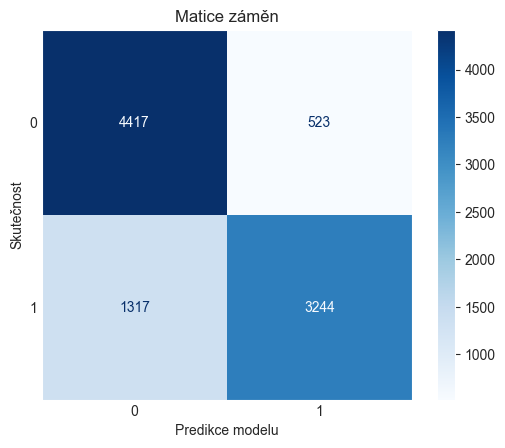

In [19]:
print_metrics(model, X_val, y_val)

Balanced accuracy: 0.7789070753145316
F1 score micro: 0.7987368421052632
F1 score macro: 0.7854035066229554
RocAuc score: 0.838400762433303
Confusion matrix:


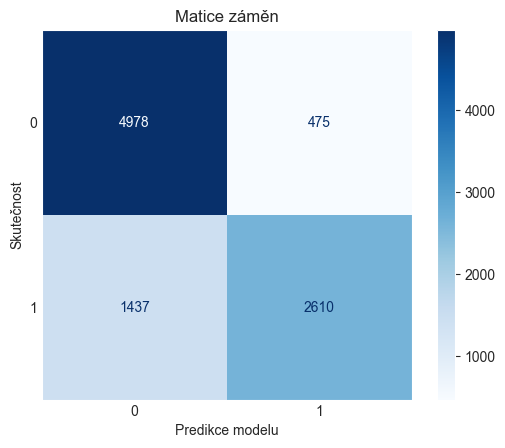

In [20]:
print_metrics(model, X_test, y_test)

In [169]:
from optuna.visualization import plot_param_importances

In [170]:
plot_param_importances(study)

In [171]:
from optuna.visualization import plot_optimization_history

In [172]:
plot_optimization_history(study)

In [173]:
# model = CatBoostClassifier(**trial.params, verbose=False, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# train_pool = Pool(X_train, y_train, feature_names=feature_names, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# val_pool = Pool(X_val, y_val, feature_names=feature_names, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
# summary = model.select_features(
#     train_pool,
#     eval_set=val_pool,
#     steps=3,
#     train_final_model=True,
#     logging_level='Silent',
#     features_for_select=feature_names,
#     num_features_to_select=4,
#     plot=True,
#     algorithm="RecursiveByShapValues"
# )
# model.save_model("model_feature_sel_2")

Porovnání modelů s num_of_offers a bez num_of_offers:

In [174]:
model_with_number_of_offers = CatBoostClassifier()
model_with_number_of_offers.load_model("catboost_model_best")
model_without_number_of_offers = CatBoostClassifier()
model_without_number_of_offers.load_model("catboost_model_best_2")

In [175]:
X_test_wo_number_of_offers = X_test.drop(columns=['number_of_offers'])
X_val_wo_number_of_offers = X_val.drop(columns=['number_of_offers'])

Balanced accuracy: 0.804223583683882
F1 score micro: 0.8079149563203873
F1 score macro: 0.804884864929553
RocAuc score: 0.8592202017279043
Confusion matrix:
Balanced accuracy: 0.780374157654528
F1 score micro: 0.8004210526315789
F1 score macro: 0.7870079685413183
RocAuc score: 0.8353088601197074
Confusion matrix:


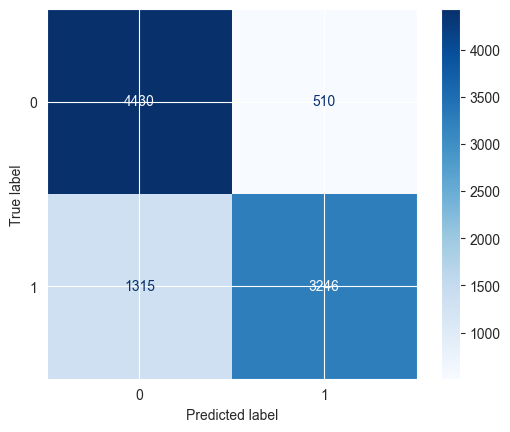

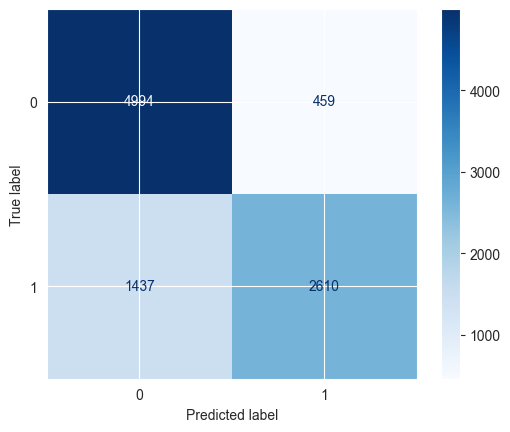

In [176]:
print_metrics(model_with_number_of_offers, X_val, y_val)
print_metrics(model_with_number_of_offers, X_test, y_test)

Balanced accuracy: 0.7239867668767148
F1 score micro: 0.7279233764866856
F1 score macro: 0.7234226437489787
RocAuc score: 0.7735232347476892
Confusion matrix:
Balanced accuracy: 0.6955046496350805
F1 score micro: 0.7166315789473685
F1 score macro: 0.698428502838904
RocAuc score: 0.7370900401848064
Confusion matrix:


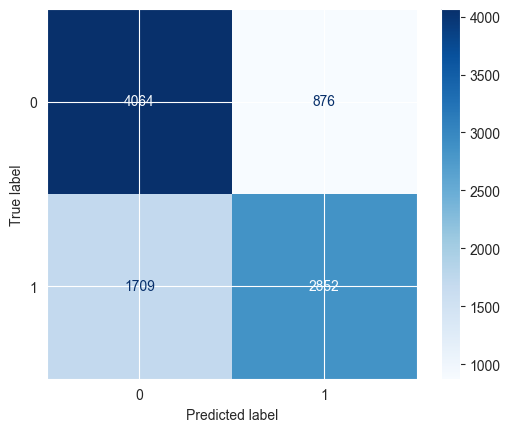

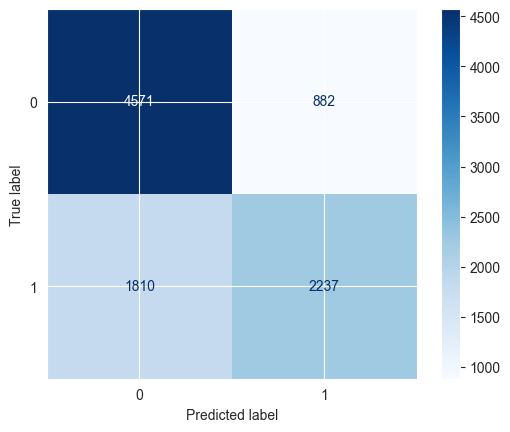

In [177]:
print_metrics(model_without_number_of_offers, X_val_wo_number_of_offers, y_val)
print_metrics(model_without_number_of_offers, X_test_wo_number_of_offers, y_test)

In [178]:
predictions = model_with_number_of_offers.predict(X_test)
pandas_predictions = pd.DataFrame(predictions, columns=['predictions'])
data = X_test.copy()
tmp = y_test.copy()
tmp = tmp.reset_index(drop=True)
data['is_winner'] = tmp.astype("str")
data['predictions'] = pandas_predictions['predictions']
data['correct'] = data['is_winner'] == data['predictions']
data.groupby('place_of_performance')['correct'].mean().sort_values(ascending=False)

place_of_performance
BELGIQUE-BELGIË         1.000000
Hamburg                 1.000000
Bratislavský kraj       1.000000
Unknown                 0.900000
Extra-Regio             0.860000
Olomoucký kraj          0.842035
Královéhradecký kraj    0.824645
Jihomoravský kraj       0.820205
Plzeňský kraj           0.815427
Pardubický kraj         0.804989
Liberecký kraj          0.801282
Moravskoslezský kraj    0.797753
Praha                   0.796296
Zlínský kraj            0.792576
Česká republika         0.788627
Kraj Vysočina           0.784127
Jihočeský kraj          0.783967
Ústecký kraj            0.781350
Středočeský kraj        0.780844
Karlovarský kraj        0.770186
Name: correct, dtype: float64

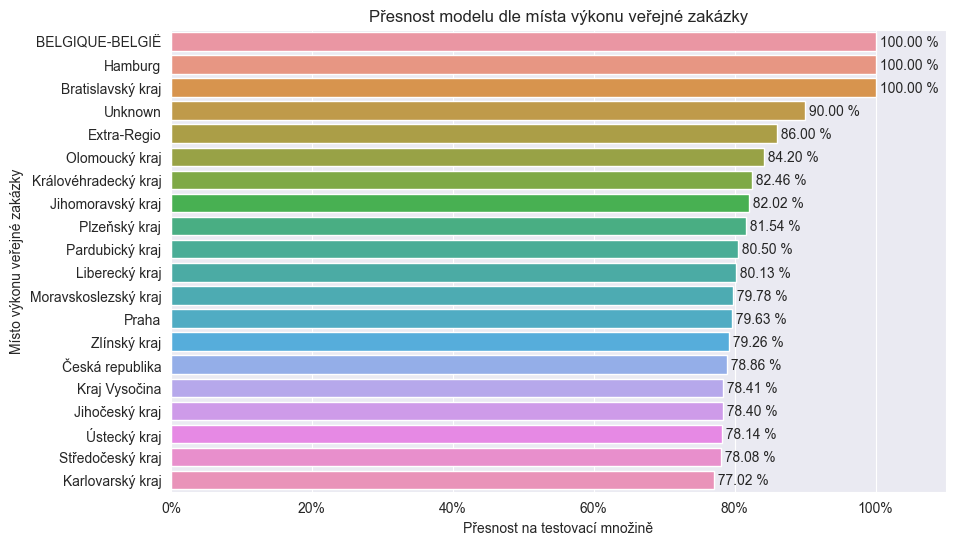

In [179]:
plt.figure(figsize=(10, 6))
barplot = sns.barplot(y='place_of_performance', x='correct', data=data, errorbar=None, order=data.groupby('place_of_performance')['correct'].mean().sort_values(ascending=False).index)

for p in barplot.patches:
        width = p.get_width()
        plt.text(width,
                 p.get_y() + p.get_height() / 2 + 0.2,
                 ' {:1.2f} %'.format(width * 100),
                 ha = 'left')

plt.xlabel('Přesnost na testovací množině')
plt.ylabel('Místo výkonu veřejné zakázky')
plt.title('Přesnost modelu dle místa výkonu veřejné zakázky')
plt.xlim(0, 1.1)
plt.xticks([0, 0.2, 0.4, 0.6, 0.8, 1], ['0%', '20%', '40%', '60%', '80%', '100%'])
plt.show()

In [180]:
X_test_all['codes'] = (X_test_all['code_from_nipez_codelist'].str[:2]).astype("str")
X_test_all['is_winner'] = tmp.astype("str")
X_test_all['predictions'] = pandas_predictions.astype("str")

In [181]:
groups = X_test_all.groupby('codes')

In [182]:
# get accuracy for each code save them in list and sort them
codes_accuracies = {}
for name, group in groups:
    group['correct'] = group['is_winner'] == group['predictions']
    codes_accuracies[name] = group['correct'].mean()

In [183]:
codes_accuracies = dict(sorted(codes_accuracies.items(), key=lambda item: item[1], reverse=True))
codes_accuracies

{'70': 1.0,
 '76': 1.0,
 '85': 1.0,
 '75': 0.9523809523809523,
 '60': 0.9285714285714286,
 '55': 0.9130434782608695,
 '73': 0.8888888888888888,
 '03': 0.8846153846153846,
 'nan': 0.875,
 '90': 0.8703071672354948,
 '50': 0.8672922252010724,
 '98': 0.8666666666666667,
 '15': 0.8620689655172413,
 '14': 0.8571428571428571,
 '80': 0.8505747126436781,
 '65': 0.8333333333333334,
 '24': 0.828125,
 '38': 0.8160919540229885,
 '77': 0.8154897494305239,
 '72': 0.8143712574850299,
 '22': 0.813953488372093,
 '33': 0.8121546961325967,
 '42': 0.8121212121212121,
 '35': 0.8055555555555556,
 '30': 0.7936507936507936,
 '45': 0.7897297297297298,
 '79': 0.7881773399014779,
 '09': 0.7857142857142857,
 '19': 0.7857142857142857,
 '18': 0.784,
 '48': 0.7838983050847458,
 '32': 0.7831325301204819,
 '43': 0.782608695652174,
 '92': 0.7818181818181819,
 '16': 0.7777777777777778,
 '31': 0.7715355805243446,
 '39': 0.7701674277016742,
 '34': 0.7701612903225806,
 '66': 0.7692307692307693,
 '37': 0.7685185185185185,
 '

In [184]:
# for each company get win ratio for is_winner and also for predictions
def get_win_ratios(data):
    win_ratio = {}
    companies_names = data["company_id"].unique()
    for name in companies_names:
        company = data[data["company_id"] == name]
        win_ratio_real = company[company["is_winner"] == "True"].shape[0] / company.shape[0]
        win_ratio_pred = company[company["predictions"] == "True"].shape[0] / company.shape[0]
        win_ratio[name] = list([win_ratio_real, win_ratio_pred, company.shape[0]])
    return win_ratio

In [185]:
def plot_win_ratio(ratio, name_of_group):
    sizes = [x[2] for x in ratio.values()]
    colors = ['Dodavatelé' for _ in range(len(ratio))]
    biggest_points = sorted(range(len(sizes)), key=lambda i: sizes[i])[-5:]
    for i in biggest_points:
        colors[i] = '5 největších dodavatelů'
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=[x[0] for x in ratio.values()], y=[x[1] for x in ratio.values()], size=sizes, hue=colors)
    #plt.text(0.5, 0.5, 'Ideální model', color='red', fontsize=12)
    plt.plot([0, 1], [0, 1], color='red', linewidth=1, alpha=0.5)
    plt.xlabel('Poměr výher reálných dat')
    plt.ylabel('Poměr výher predikcí modelu')
    plt.title(f'Poměr výher v rámci NIPEZ kódu {name_of_group}: reálná data vs predikce modelu')
    plt.show()

In [186]:
def plot_hexbin(ratio, name_of_group):
    plt.figure(figsize=(10, 6))
    hb = plt.hexbin(x=[x[0] for x in ratio.values()], y=[x[1] for x in ratio.values()], gridsize=20, cmap='Blues')
    cb = plt.colorbar(hb)
    cb.set_label('Počet nabídek od dodavatelů') # kteří mají daný poměr výher
    plt.xlabel('Poměr výher reálných dat')
    plt.ylabel('Poměr výher predikcí modelu')
    plt.title(f'Poměr výher v rámci NIPEZ kódu {name_of_group}: reálná data vs predikce modelu')
    plt.show()

In [187]:
def plot_confusion_matrix(group, name_of_group):
    confusions = confusion_matrix(group['is_winner'], group['predictions'], labels=['True', 'False'])
    ConfusionMatrixDisplay(confusions).plot(cmap='Blues')
    plt.xlabel('Predikce modelu')
    plt.ylabel('Skutečnost')
    plt.title(f'Maticová reprezentace predikcí modelu pro NIPEZ kód {name_of_group}')
    plt.tick_params(axis=u'both', which=u'both',length=0)
    plt.grid(False)
    plt.show()

In [188]:
def plot_ratios(groups, name):
    group = groups.get_group(name)
    ratio = get_win_ratios(group)
    plot_win_ratio(ratio, name_of_group=name)
    plot_hexbin(ratio, name_of_group=name)
    plot_confusion_matrix(group, name_of_group=name)
    


5 nejhůře predikovatelných sektorů

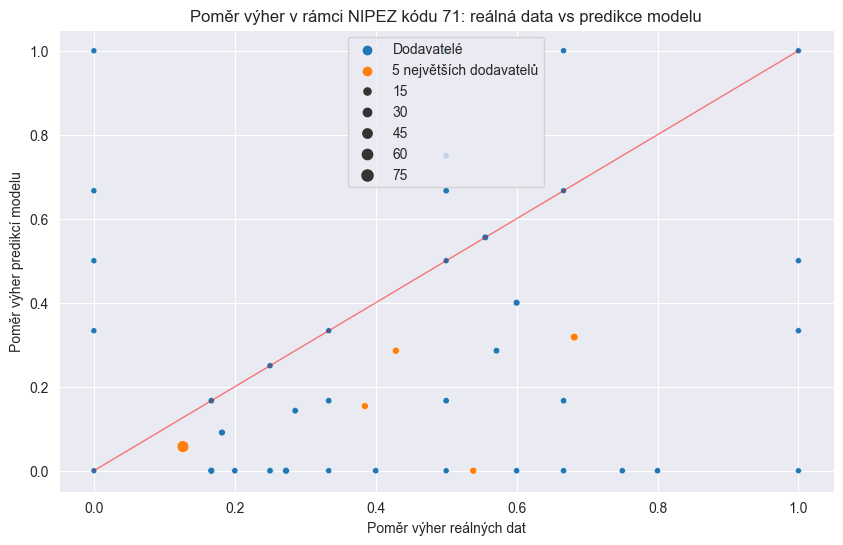

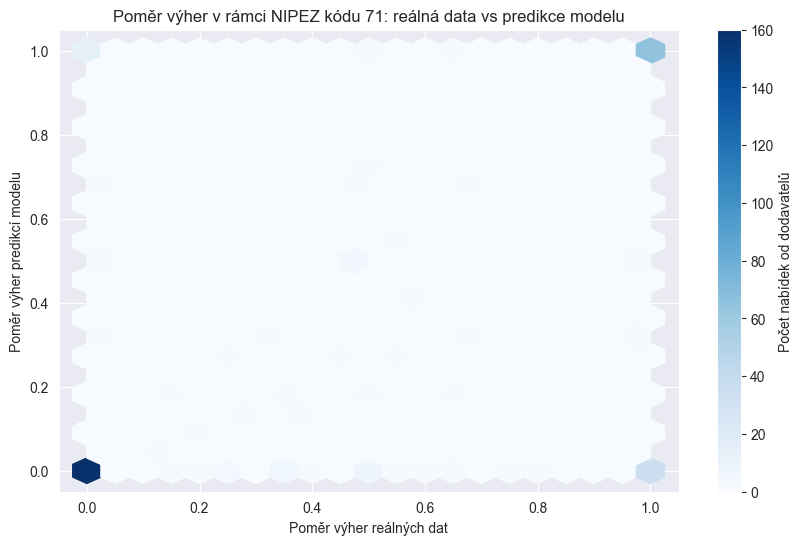

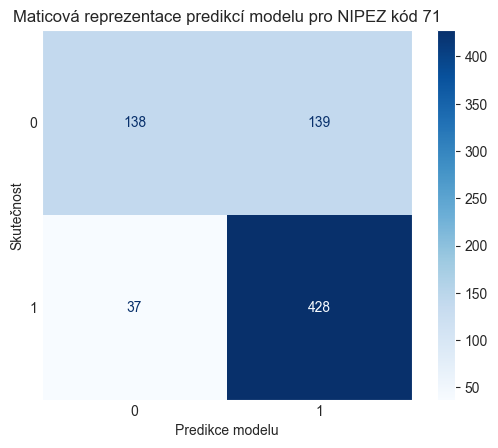

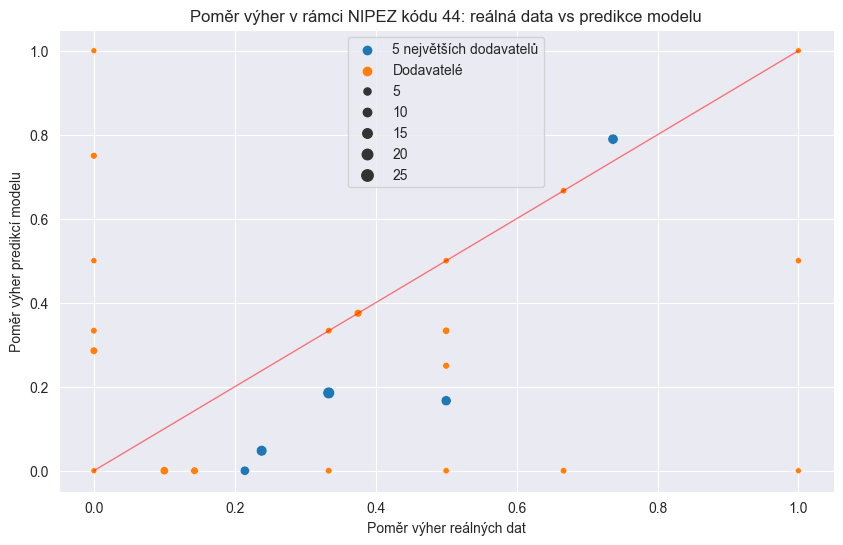

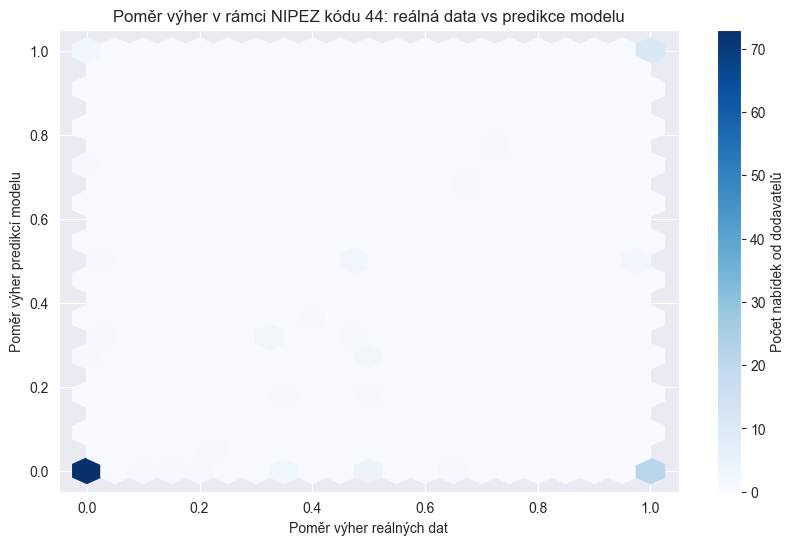

...

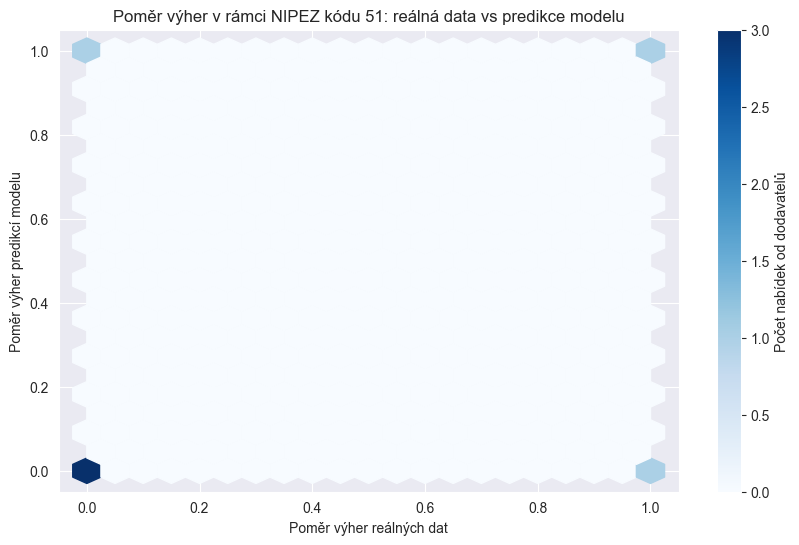

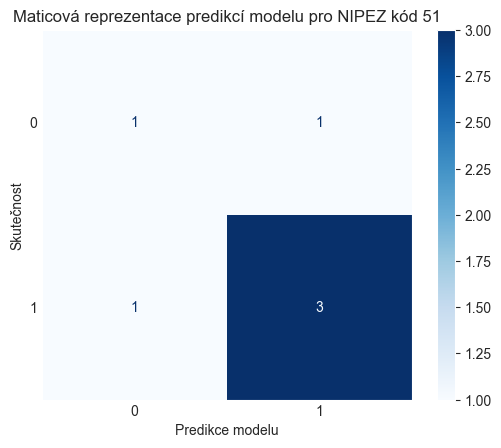

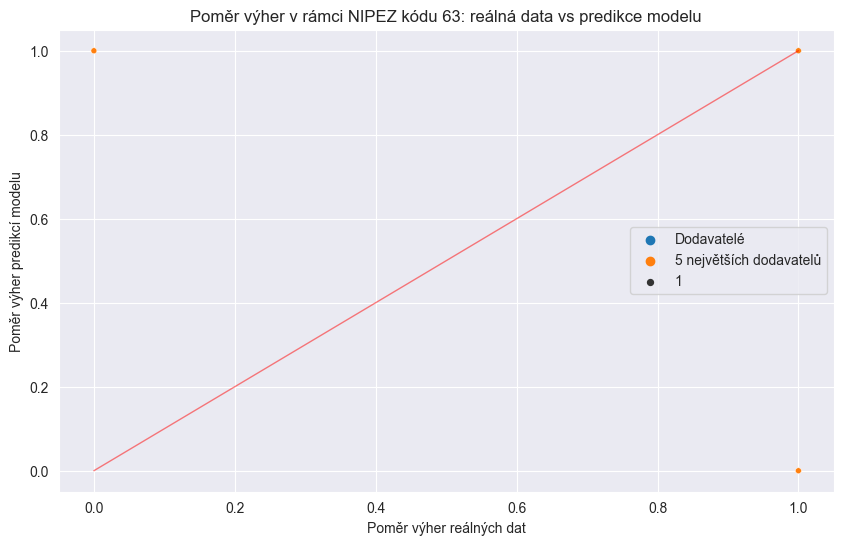

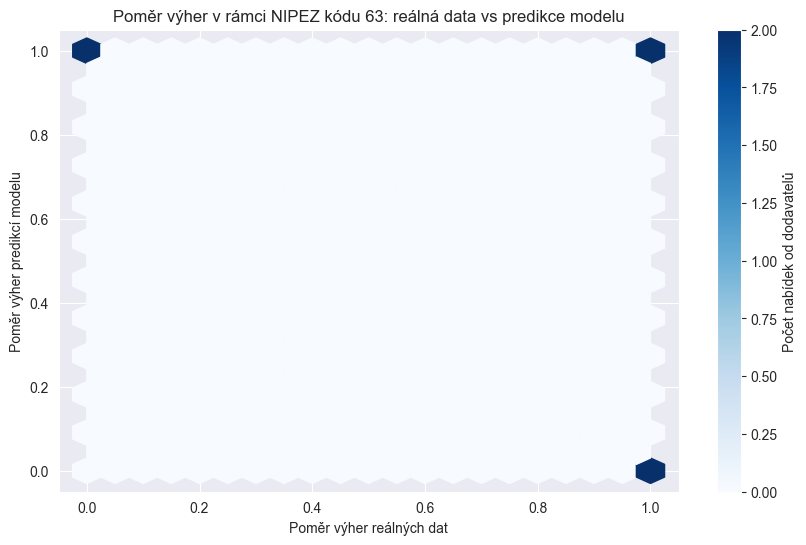

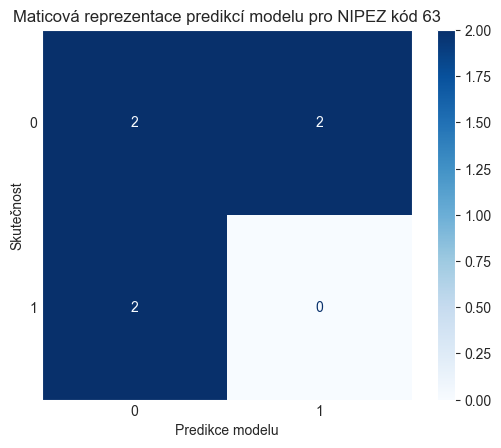

In [189]:
plot_ratios(groups, '71')
plot_ratios(groups, '44')
plot_ratios(groups, '64')
plot_ratios(groups, '51')
plot_ratios(groups, '63')

5 nejlépe predikovatelných sektorů

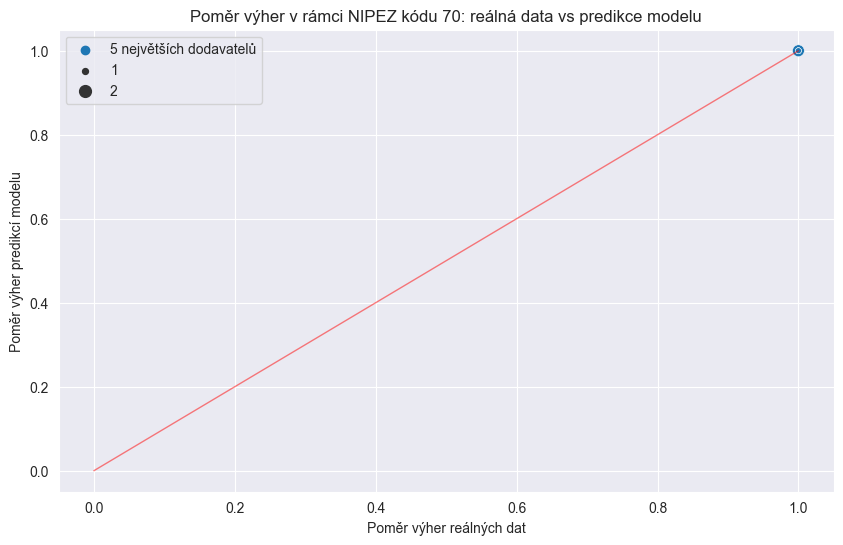

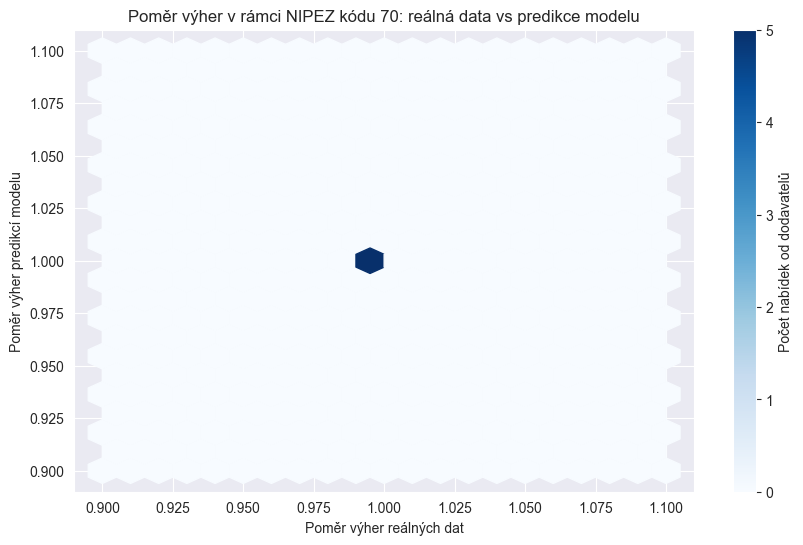

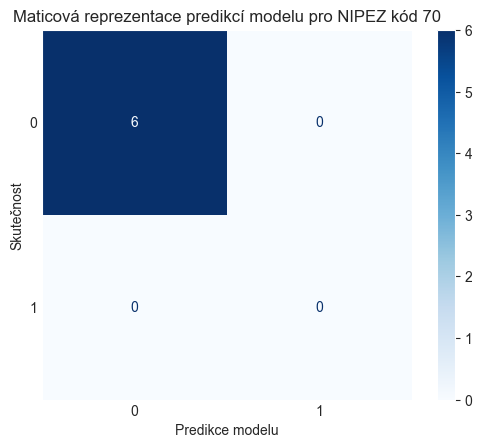

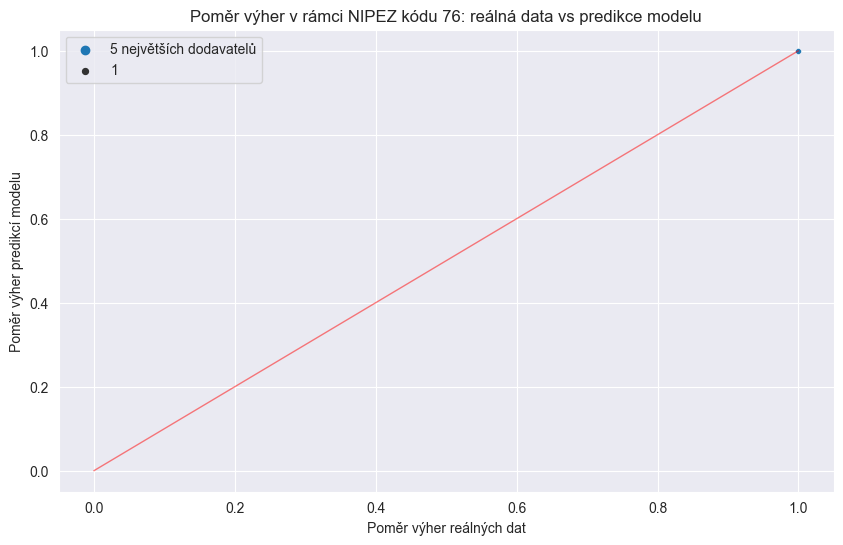

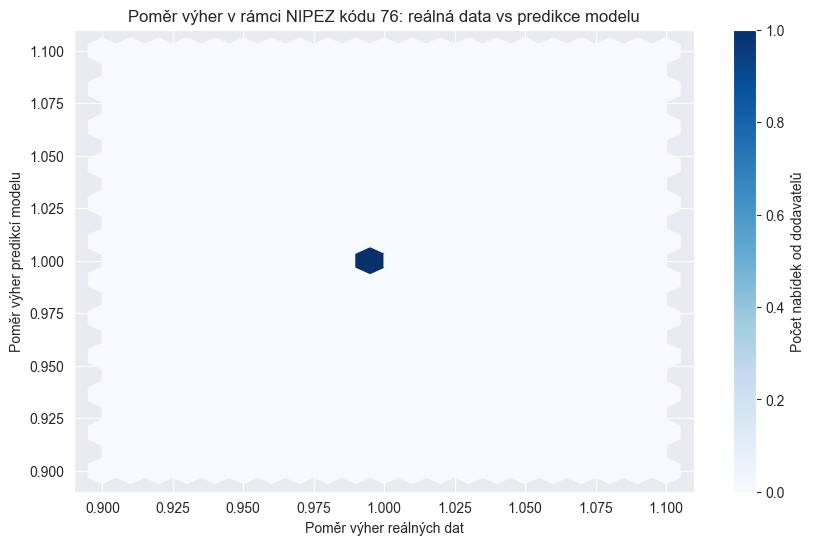

...

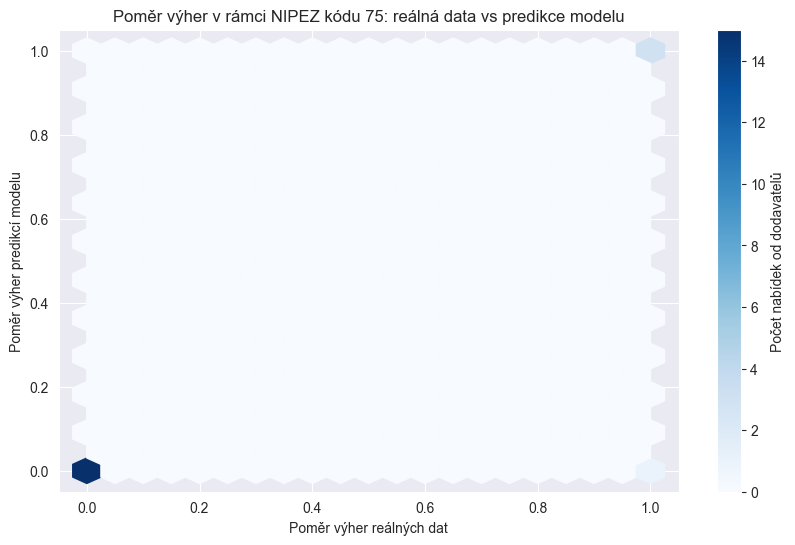

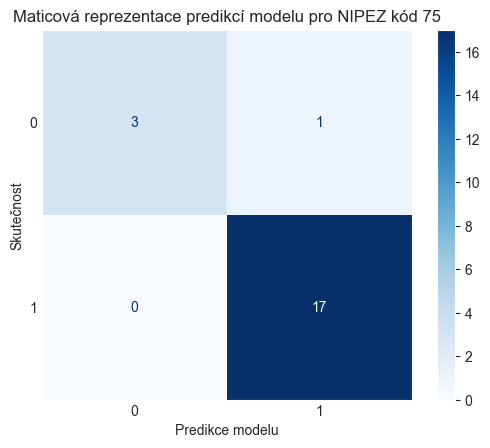

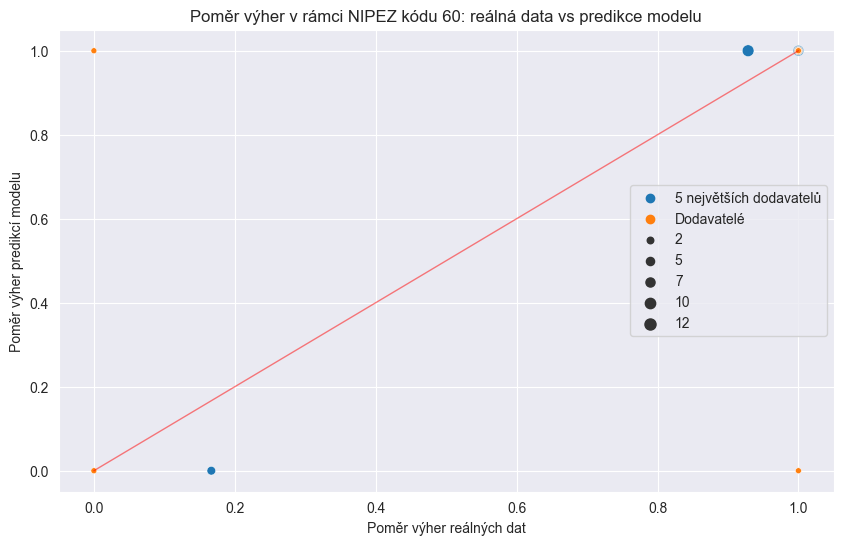

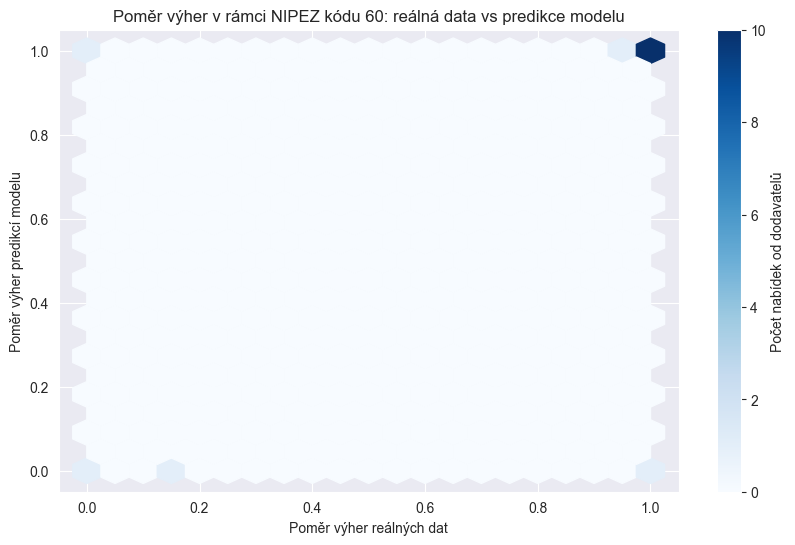

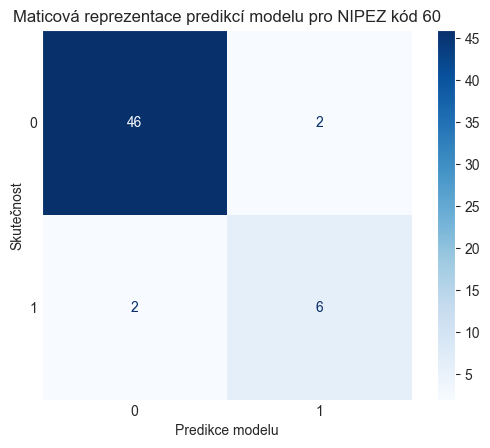

In [190]:
plot_ratios(groups, '70')
plot_ratios(groups, '76')
plot_ratios(groups, '85')
plot_ratios(groups, '75')
plot_ratios(groups, '60')

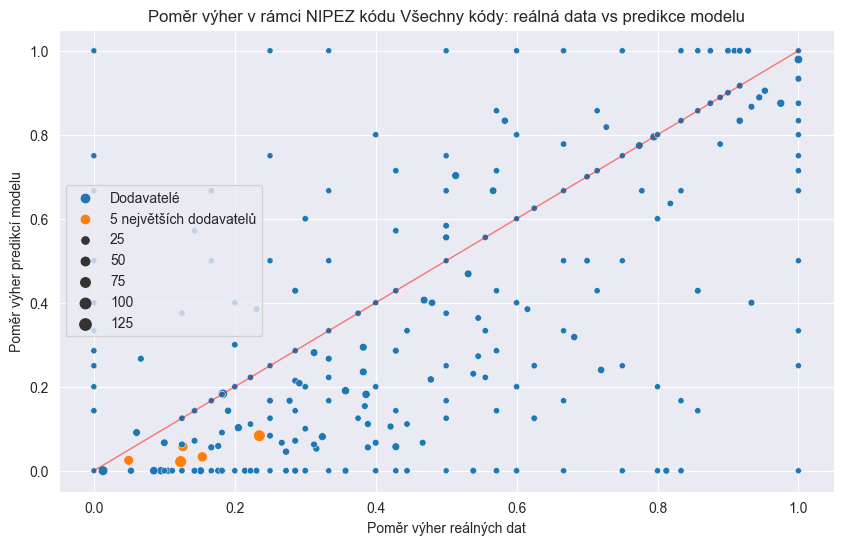

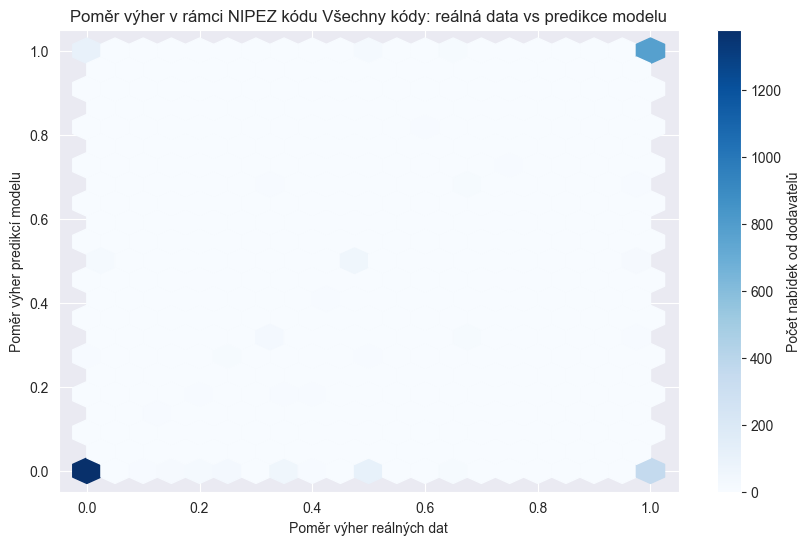

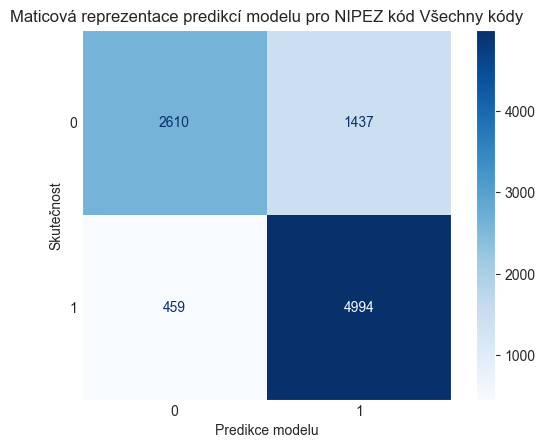

In [191]:
ratio = get_win_ratios(X_test_all)
plot_win_ratio(ratio, name_of_group="Všechny kódy")
plot_hexbin(ratio, name_of_group="Všechny kódy")
plot_confusion_matrix(X_test_all, name_of_group="Všechny kódy")

In [192]:
X_test_all_correct = X_test_all[X_test_all['is_winner'] == X_test_all['predictions']].copy()
X_test_all_correct.drop(columns=['date_of_contract_close', 'date_of_publication', 'contact_person_id', 'organisation_id', 'address_id_x','code_from_nipez_codelist', 'id', 'url','address_id_y', 'bids_submission_deadline'], inplace=True)

In [193]:
type_schema = { 
               "place_of_performance": "categorical",
               "public_contract_regime": "categorical",
                "type": "categorical",
                "type_of_procedure": "categorical",
               "contracting_authority_id": "categorical",
               "company_id": "categorical",
               "contracting_authority_name": "categorical",
               "distance": "categorical",
               "codes": "categorical"}
correlations = {
            "auto": {"calculate": False},
            "pearson": {"calculate": True},
            "spearman": {"calculate": True},
            "kendall": {"calculate": True},
            "phi_k": {"calculate": True},
            "cramers": {"calculate": True}}
               

In [194]:
X_test_all_correct

,is_association_of_suppliers,is_rejected_due_too_low,is_withdrawn,price,price_vat,company_id,number_of_offers,contract_price,contract_price_vat,contract_price_with_amendments,...,bids_close_interval,contracting_authority_name,total_offers,total_wins,total_procurements,distance,num_of_nan,codes,is_winner,predictions
0,False,False,False,NaN,NaN,398,9,498667.40,603387.55,498667.40,...,10.0,Česká informační agentura životního prostředí,443,158,73,nan,3,48,False,False
1,False,False,False,1240.00,1500.40,9627,1,496000.00,600160.00,496000.00,...,NaN,Národní knihovna České republiky,1,0,43,nan,5,92,True,True
2,False,False,False,1127737.93,1364562.90,3005,5,1541000.00,1864610.00,1541000.00,...,9.0,Státní úřad inspekce práce,57,10,157,"[15,50)",0,30,False,False
3,False,False,False,1130481.83,1367883.01,1393,5,1541000.00,1864610.00,1541000.00,...,9.0,Státní úřad inspekce práce,5,2,157,"[15,50)",0,30,False,False
5,False,False,False,109615.88,132635.21,1144,1,109615.88,132635.21,109615.88,...,NaN,Národní knihovna České republiky,1,1,43,nan,4,50,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9491,False,False,False,156075.20,188850.99,720,4,155763.50,188473.84,155763.50,...,NaN,Zařízení služeb pro Ministerstvo vnitra,66,32,349,nan,3,30,False,False
9492,False,False,False,NaN,NaN,6419,1,400000.00,484000.00,400000.00,...,27.0,Moravská galerie v Brně,1,0,3,nan,3,79,True,True
9497,False,False,False,206543.78,249917.97,517,3,173665.00,210134.65,173665.00,...,9.0,"Vojenská lázeňská a rekreační zařízení, příspě...",92,18,425,"[100,+inf)",0,39,False,False
9498,False,False,False,140011.70,177230.00,6422,4,87597.07,105992.45,87597.07,...,15.0,"Vojenská lázeňská a rekreační zařízení, příspě...",1,0,425,"[50,100)",2,31,False,False


In [195]:
# report_correct = ProfileReport(X_test_all_correct, title="Correct predictions", 
#                                type_schema=type_schema, correlations=correlations, 
#                                missing_diagrams={"Heatmap": False})
# report_correct.to_file("Correct_predictions_profile.html")

In [196]:
X_test_all_wrong = X_test_all[X_test_all['is_winner'] != X_test_all['predictions']].copy()
X_test_all_wrong.drop(columns=['date_of_contract_close', 'date_of_publication', 'contact_person_id', 'organisation_id', 'address_id_x', 'id', 'url','address_id_y', 'bids_submission_deadline'], inplace=True)

In [197]:
# report_wrong = ProfileReport(X_test_all_wrong, title="Wrong predictions", 
#                              type_schema=type_schema, correlations=correlations, 
#                              missing_diagrams={"Heatmap": False})
# report_wrong.to_file("Wrong_predictions_profile.html")

In [198]:
X_test_all['correct'] = X_test_all['is_winner'] == X_test_all['predictions']
X_test_all.columns

Index(['is_association_of_suppliers', 'is_rejected_due_too_low',
       'is_withdrawn', 'price', 'price_vat', 'company_id', 'number_of_offers',
       'bids_submission_deadline', 'code_from_nipez_codelist',
       'contract_price', 'contract_price_vat',
       'contract_price_with_amendments', 'contract_price_with_amendments_vat',
       'date_of_contract_close', 'date_of_publication', 'place_of_performance',
       'public_contract_regime', 'type', 'type_of_procedure',
       'contact_person_id', 'contracting_authority_id',
       'publication_close_interval', 'bids_close_interval', 'organisation_id',
       'address_id_x', 'id', 'contracting_authority_name', 'url',
       'address_id_y', 'total_offers', 'total_wins', 'total_procurements',
       'distance', 'num_of_nan', 'codes', 'is_winner', 'predictions',
       'correct'],
      dtype='object')

<Axes: xlabel='count', ylabel='place_of_performance'>

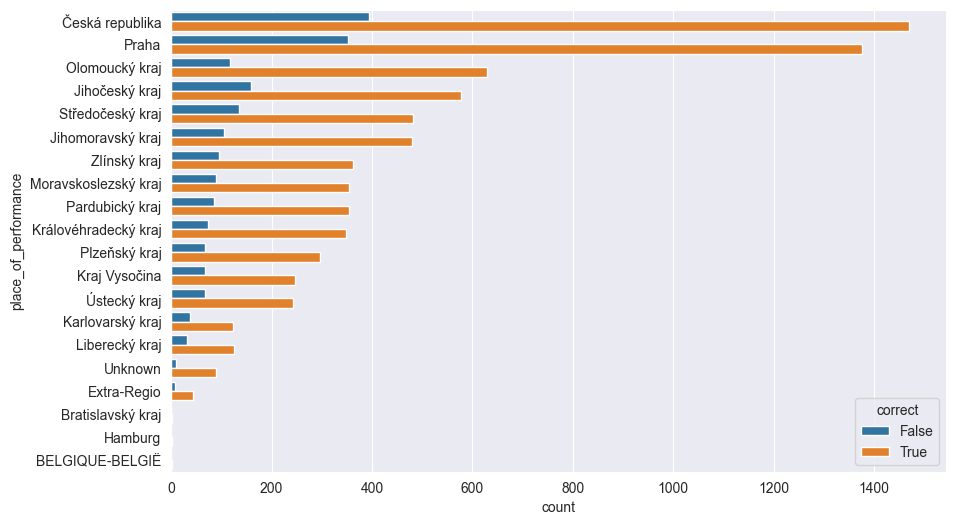

In [199]:
# graph of number of rows per place of performance and their correctness
plt.figure(figsize=(10, 6))
sns.countplot(data=X_test_all, y='place_of_performance', hue='correct', order=X_test_all['place_of_performance'].value_counts().index)


<Axes: xlabel='count', ylabel='type'>

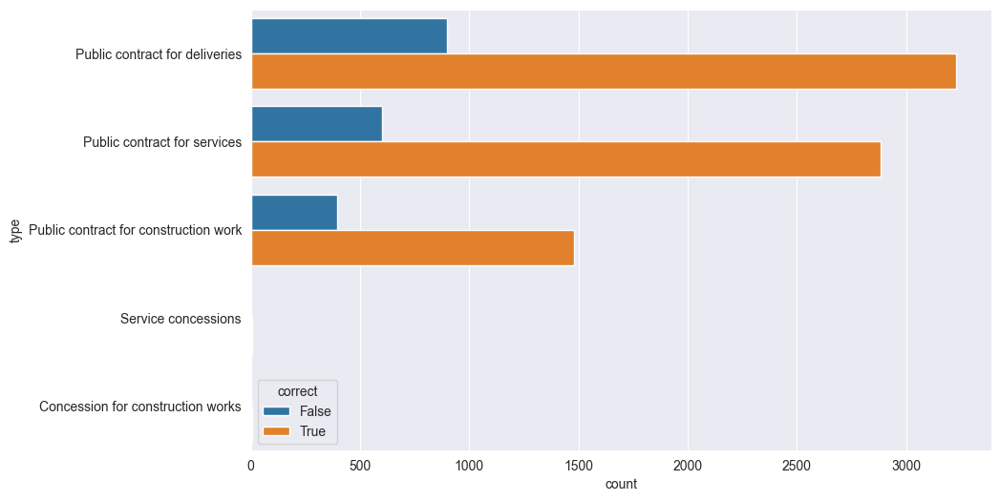

In [200]:
plt.figure(figsize=(10, 6))
sns.countplot(data=X_test_all, y='type', hue='correct', order=X_test_all['type'].value_counts().index)

<Axes: xlabel='count', ylabel='public_contract_regime'>

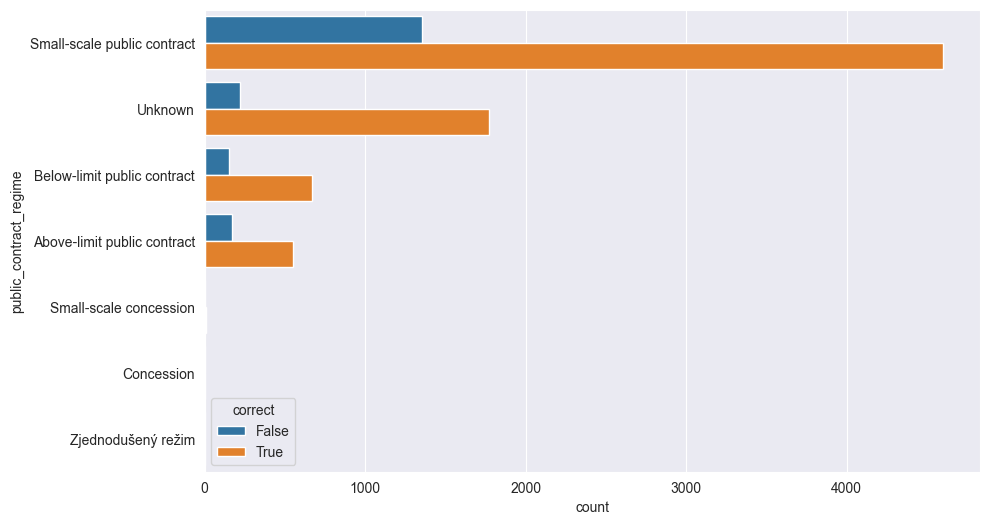

In [201]:
plt.figure(figsize=(10, 6))
sns.countplot(data=X_test_all, y='public_contract_regime', hue='correct', order=X_test_all['public_contract_regime'].value_counts().index)

<Axes: xlabel='count', ylabel='type_of_procedure'>

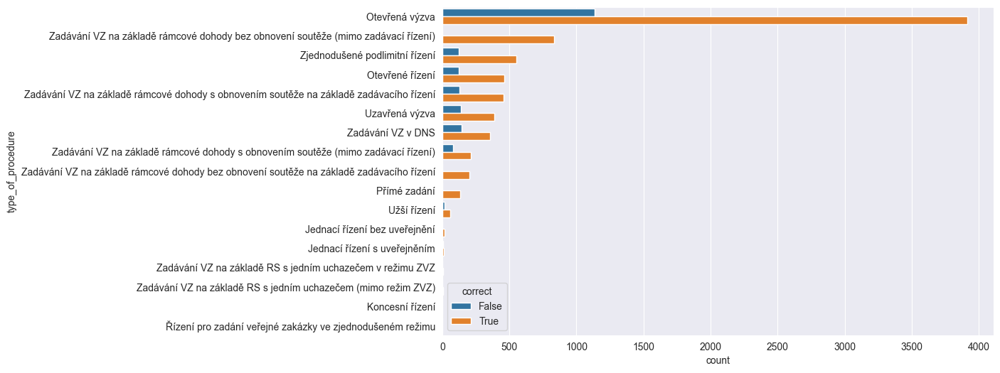

In [202]:
plt.figure(figsize=(10, 6))
sns.countplot(data=X_test_all, y='type_of_procedure', hue='correct', order=X_test_all['type_of_procedure'].value_counts().index)

In [203]:
train_pool = Pool(X_train, y_train, feature_names=feature_names, cat_features=['place_of_performance', 'public_contract_regime', 'type', 'type_of_procedure', 'distance'])
shap_val = model.get_feature_importance(data=train_pool, type='ShapValues')

In [204]:
shap_val_altered = shap_val[:,1,:-1]

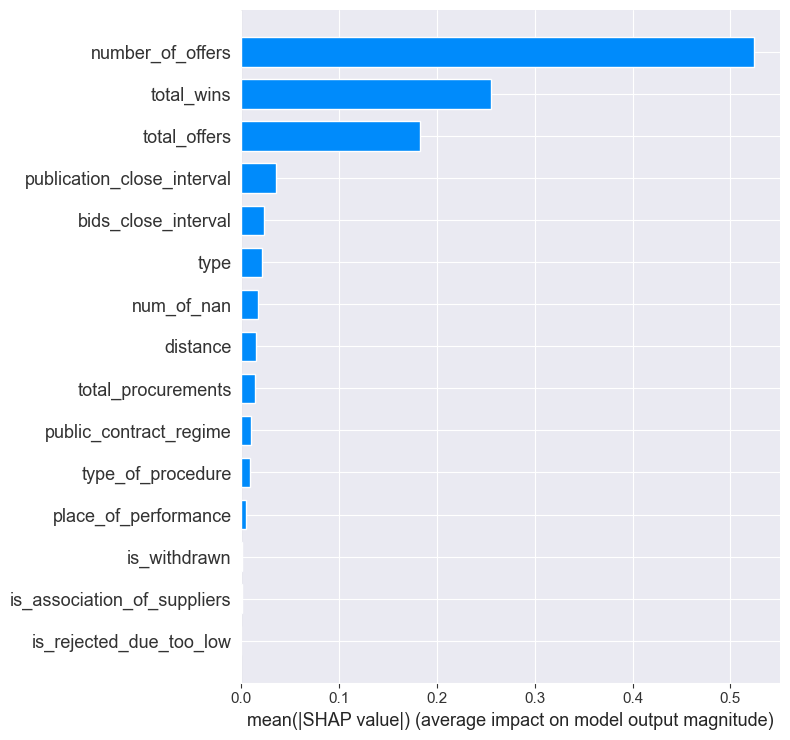

In [205]:
shap.summary_plot(shap_val_altered, X_train, plot_type='bar')

In [206]:
correct_for_DBSCAN = X_test_all_correct.drop(columns=['is_winner', 'predictions', 'contracting_authority_name', 'contracting_authority_id', 'company_id']) 

In [207]:
from sklearn.impute import SimpleImputer

In [208]:
# get number of nan of dataframe
correct_for_DBSCAN.isna().sum()

is_association_of_suppliers              0
is_rejected_due_too_low                  0
is_withdrawn                             0
price                                 1158
price_vat                             1004
number_of_offers                         0
contract_price                           0
contract_price_vat                       0
contract_price_with_amendments           0
contract_price_with_amendments_vat       0
place_of_performance                     0
public_contract_regime                   0
type                                     0
type_of_procedure                        0
publication_close_interval               0
bids_close_interval                   2468
total_offers                             0
total_wins                               0
total_procurements                       0
distance                                 0
num_of_nan                               0
codes                                    0
dtype: int64

In [209]:
# fill nan values with median
correct_for_DBSCAN['place_of_performance'].fillna('unknown', inplace=True)
correct_for_DBSCAN['public_contract_regime'].fillna('unknown', inplace=True)
correct_for_DBSCAN['codes'].fillna(-1, inplace=True)

In [210]:
imputer = SimpleImputer(strategy='median')
correct_for_DBSCAN['price'] = imputer.fit_transform(correct_for_DBSCAN[['price']])
correct_for_DBSCAN['price_vat'] = imputer.fit_transform(correct_for_DBSCAN[['price_vat']])
correct_for_DBSCAN['bids_close_interval'] = imputer.fit_transform(correct_for_DBSCAN[['bids_close_interval']])

In [211]:
correct_for_DBSCAN.dropna(inplace=True)

In [212]:
gower_correct = gower.gower_matrix(correct_for_DBSCAN)

In [213]:
from sklearn.cluster import DBSCAN

In [214]:
dbscan = DBSCAN(eps=0.1, min_samples=10, metric='precomputed')
dbscan.fit(gower_correct)

DBSCAN(eps=0.1, metric='precomputed', min_samples=10)

In [215]:
labels = dbscan.labels_

In [216]:
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 5
Estimated number of noise points: 122


In [217]:
correct_for_DBSCAN['cluster'] = labels

In [218]:
correct_for_DBSCAN['cluster'].value_counts()

cluster
 0    7423
-1     122
 1      17
 4      16
 3      15
 2      11
Name: count, dtype: int64

In [219]:
wrong_for_DBSCAN = X_test_all_wrong.drop(columns=['is_winner', 'predictions', 'contracting_authority_name', 'contracting_authority_id', 'company_id']) 

In [220]:
wrong_for_DBSCAN.isna().sum()

is_association_of_suppliers             0
is_rejected_due_too_low                 0
is_withdrawn                            0
price                                 337
price_vat                             281
number_of_offers                        0
code_from_nipez_codelist                4
contract_price                          0
contract_price_vat                      0
contract_price_with_amendments          0
contract_price_with_amendments_vat      0
place_of_performance                    0
public_contract_regime                  0
type                                    0
type_of_procedure                       0
publication_close_interval              0
bids_close_interval                   453
total_offers                            0
total_wins                              0
total_procurements                      0
distance                                0
num_of_nan                              0
codes                                   0
dtype: int64

In [221]:
wrong_for_DBSCAN['place_of_performance'].fillna('unknown', inplace=True)
wrong_for_DBSCAN['public_contract_regime'].fillna('unknown', inplace=True)
wrong_for_DBSCAN['codes'].fillna(-1, inplace=True)

In [222]:
wrong_for_DBSCAN['price'] = imputer.fit_transform(wrong_for_DBSCAN[['price']])
wrong_for_DBSCAN['price_vat'] = imputer.fit_transform(wrong_for_DBSCAN[['price_vat']])
wrong_for_DBSCAN['bids_close_interval'] = imputer.fit_transform(wrong_for_DBSCAN[['bids_close_interval']])

In [223]:
gower_wrong = gower.gower_matrix(wrong_for_DBSCAN)

In [224]:
dbscan_wrong = DBSCAN(eps=0.1, min_samples=15, metric='precomputed')
dbscan_wrong.fit(gower_wrong)

DBSCAN(eps=0.1, metric='precomputed', min_samples=15)

In [225]:
labels_wrong = dbscan_wrong.labels_


In [226]:
n_clusters_wrong = len(set(labels_wrong)) - (1 if -1 in labels_wrong else 0)
n_noise_wrong = list(labels_wrong).count(-1)

print("Estimated number of clusters: %d" % n_clusters_wrong)
print("Estimated number of noise points: %d" % n_noise_wrong)

Estimated number of clusters: 4
Estimated number of noise points: 776


In [227]:
wrong_for_DBSCAN['cluster'] = labels_wrong

In [228]:
wrong_for_DBSCAN['cluster'].value_counts()

cluster
 2    922
-1    776
 1     88
 3     79
 0     31
Name: count, dtype: int64

In [229]:
# plot histogram of price for each of clusters but only with between 5 and 95 percentile
clusters = correct_for_DBSCAN.groupby('cluster')

In [230]:
clusters

C:\Users\marti\PycharmProjects\bakalarka\venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



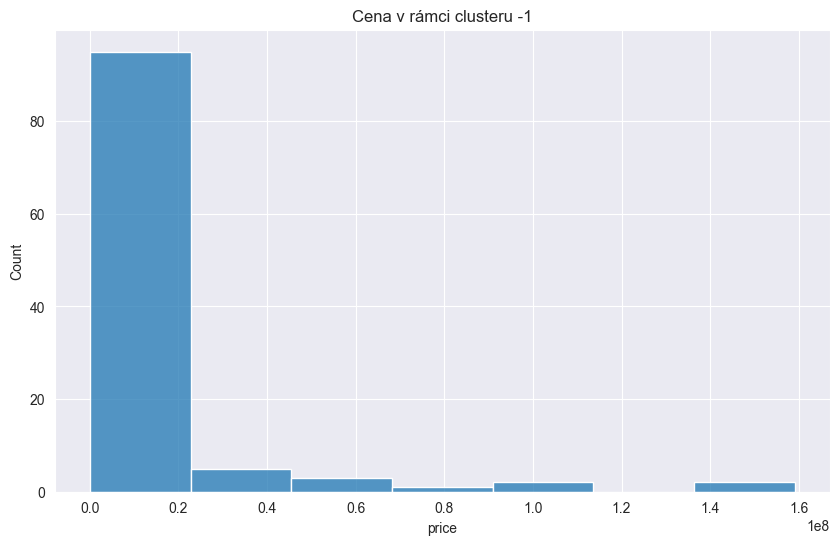

C:\Users\marti\PycharmProjects\bakalarka\venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



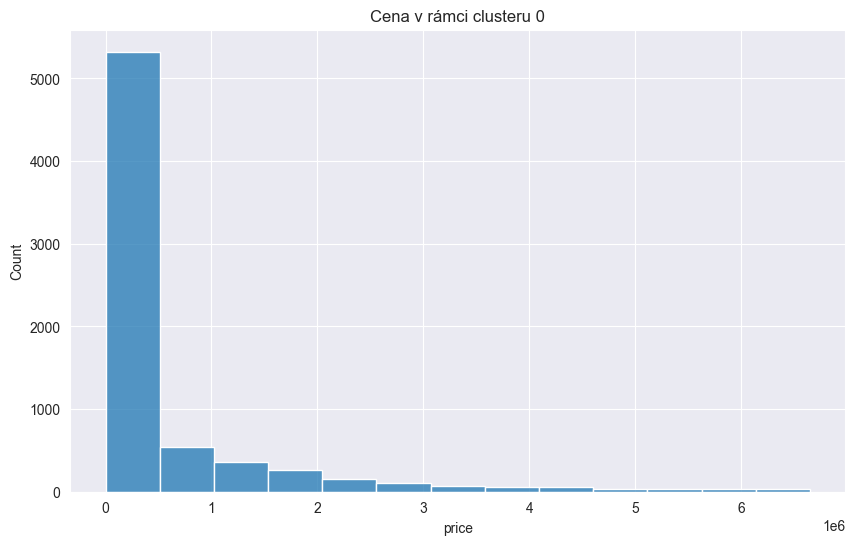

C:\Users\marti\PycharmProjects\bakalarka\venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



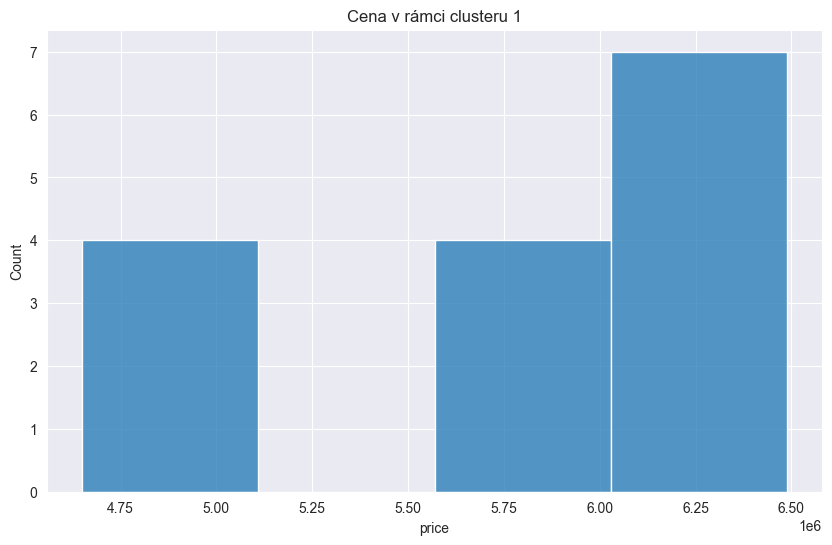

C:\Users\marti\PycharmProjects\bakalarka\venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



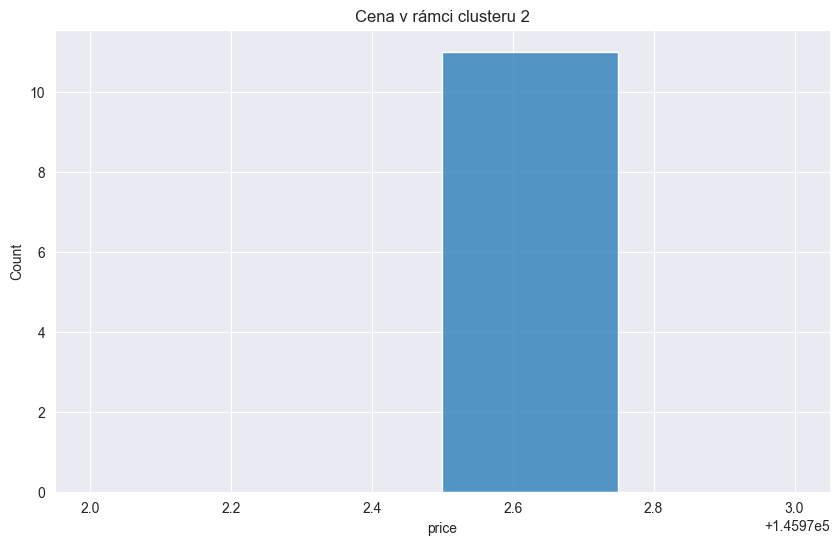

C:\Users\marti\PycharmProjects\bakalarka\venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



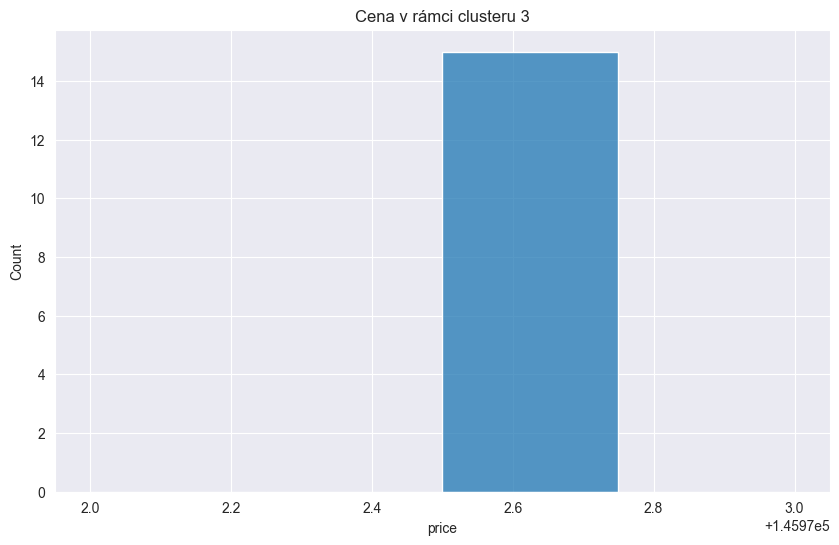

C:\Users\marti\PycharmProjects\bakalarka\venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



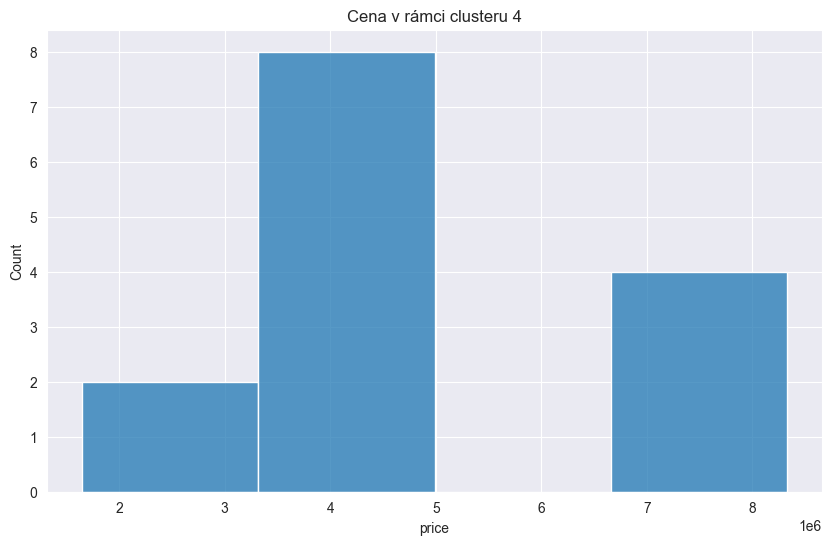

In [231]:
for name, group in clusters:
    group = group[group['price'].between(group['price'].quantile(.05), group['price'].quantile(.95))]
    plt.figure(figsize=(10, 6))
    sns.histplot(group, x='price', bins= int(1 + np.log2(group.shape[0])))
    plt.title(f'Cena v rámci clusteru {name}')
    plt.show()

In [232]:
correct_for_DBSCAN

,is_association_of_suppliers,is_rejected_due_too_low,is_withdrawn,price,price_vat,number_of_offers,contract_price,contract_price_vat,contract_price_with_amendments,contract_price_with_amendments_vat,...,type_of_procedure,publication_close_interval,bids_close_interval,total_offers,total_wins,total_procurements,distance,num_of_nan,codes,cluster
0,False,False,False,145972.50,174756.165,9,498667.40,603387.55,498667.40,603387.55,...,Otevřená výzva,27.0,10.0,443,158,73,nan,3,48,0
1,False,False,False,1240.00,1500.400,1,496000.00,600160.00,496000.00,600160.00,...,Uzavřená výzva,-1.0,12.0,1,0,43,nan,5,92,0
2,False,False,False,1127737.93,1364562.900,5,1541000.00,1864610.00,1541000.00,1864610.00,...,Otevřená výzva,29.0,9.0,57,10,157,"[15,50)",0,30,0
3,False,False,False,1130481.83,1367883.010,5,1541000.00,1864610.00,1541000.00,1864610.00,...,Otevřená výzva,29.0,9.0,5,2,157,"[15,50)",0,30,0
5,False,False,False,109615.88,132635.210,1,109615.88,132635.21,109615.88,132635.21,...,Přímé zadání,-7.0,12.0,1,1,43,nan,4,50,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9491,False,False,False,156075.20,188850.990,4,155763.50,188473.84,155763.50,188473.84,...,Zadávání VZ v DNS,-2.0,12.0,66,32,349,nan,3,30,0
9492,False,False,False,145972.50,174756.165,1,400000.00,484000.00,400000.00,484000.00,...,Otevřené řízení,40.0,27.0,1,0,3,nan,3,79,0
9497,False,False,False,206543.78,249917.970,3,173665.00,210134.65,173665.00,210134.65,...,Otevřená výzva,20.0,9.0,92,18,425,"[100,+inf)",0,39,0
9498,False,False,False,140011.70,177230.000,4,87597.07,105992.45,87597.07,105992.45,...,Otevřená výzva,26.0,15.0,1,0,425,"[50,100)",2,31,0


<Axes: xlabel='count', ylabel='public_contract_regime'>

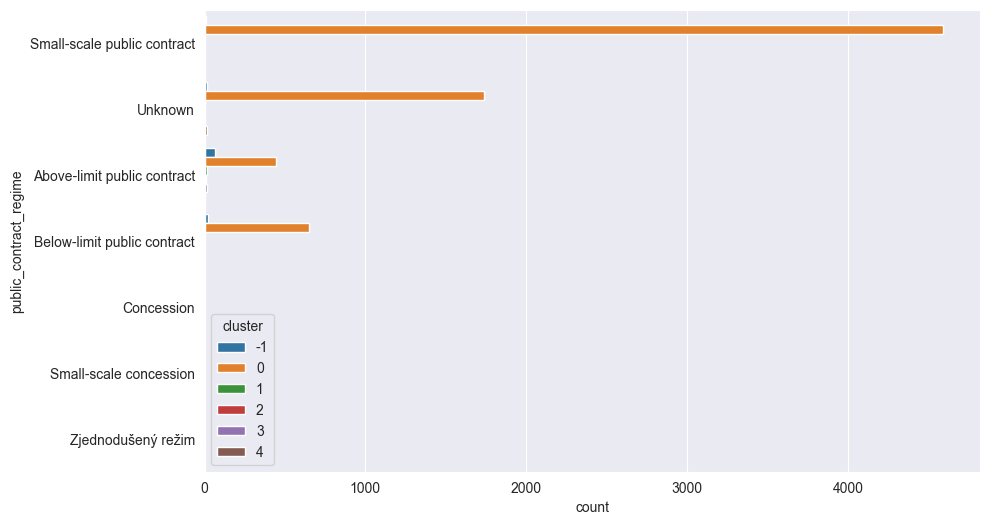

In [233]:
plt.figure(figsize=(10, 6))
sns.countplot(data=correct_for_DBSCAN, y='public_contract_regime', hue='cluster')

In [234]:
# Calculate the percentages
percentages = {}
for name, group in clusters:
    percentages[name] = group['public_contract_regime'].value_counts(normalize=True)

In [235]:
percentages

{-1: public_contract_regime
 Above-limit public contract    0.532787
 Below-limit public contract    0.163934
 Unknown                        0.147541
 Small-scale public contract    0.073770
 Small-scale concession         0.040984
 Concession                     0.024590
 Zjednodušený režim             0.016393
 Name: proportion, dtype: float64,
 0: public_contract_regime
 Small-scale public contract    0.618214
 Unknown                        0.234002
 Below-limit public contract    0.087296
 Above-limit public contract    0.059949
 Small-scale concession         0.000539
 Name: proportion, dtype: float64,
 1: public_contract_regime
 Above-limit public contract    1.0
 Name: proportion, dtype: float64,
 2: public_contract_regime
 Above-limit public contract    1.0
 Name: proportion, dtype: float64,
 3: public_contract_regime
 Above-limit public contract    1.0
 Name: proportion, dtype: float64,
 4: public_contract_regime
 Unknown    1.0
 Name: proportion, dtype: float64}

,-1,0,1,2,3,4
public_contract_regime,,,,,,
Above-limit public contract,0.532787,0.059949,1.0,1.0,1.0,NaN
Below-limit public contract,0.163934,0.087296,NaN,NaN,NaN,NaN
Concession,0.024590,NaN,NaN,NaN,NaN,NaN
Small-scale concession,0.040984,0.000539,NaN,NaN,NaN,NaN
Small-scale public contract,0.073770,0.618214,NaN,NaN,NaN,NaN
Unknown,0.147541,0.234002,NaN,NaN,NaN,1.0
Zjednodušený režim,0.016393,NaN,NaN,NaN,NaN,NaN


<Figure size 1000x600 with 0 Axes>

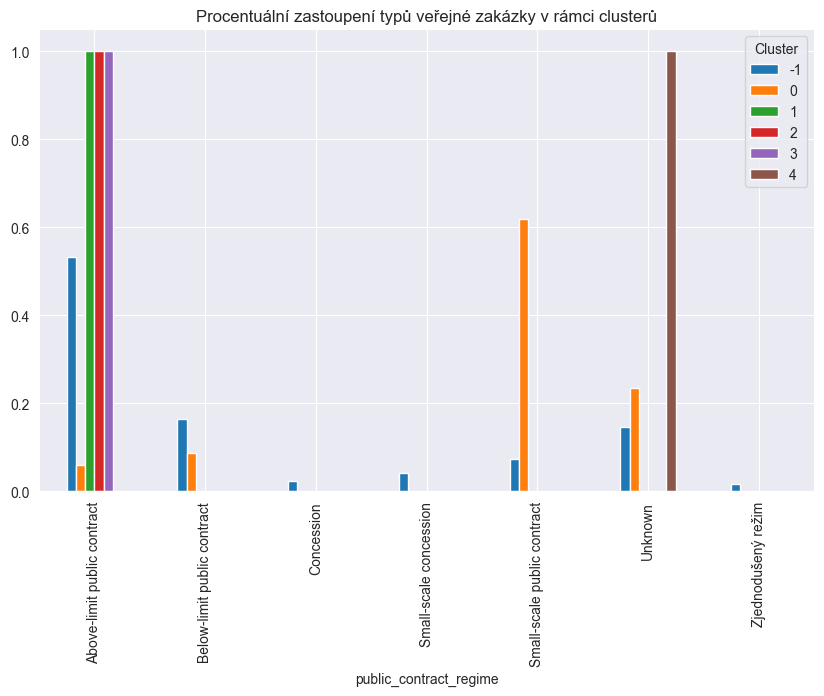

In [236]:
# Create a dataframe from the percentages dictionary
percentages_df = pd.DataFrame(percentages)
display(percentages_df)
# Plot the stacked bar plot

plt.figure(figsize=(10, 6))
percentages_df.plot(kind='bar', figsize=(10, 6))
plt.legend(title='Cluster')
plt.title('Procentuální zastoupení typů veřejné zakázky v rámci clusterů')
plt.show()


<Axes: xlabel='percentage', ylabel='public_contract_regime'>

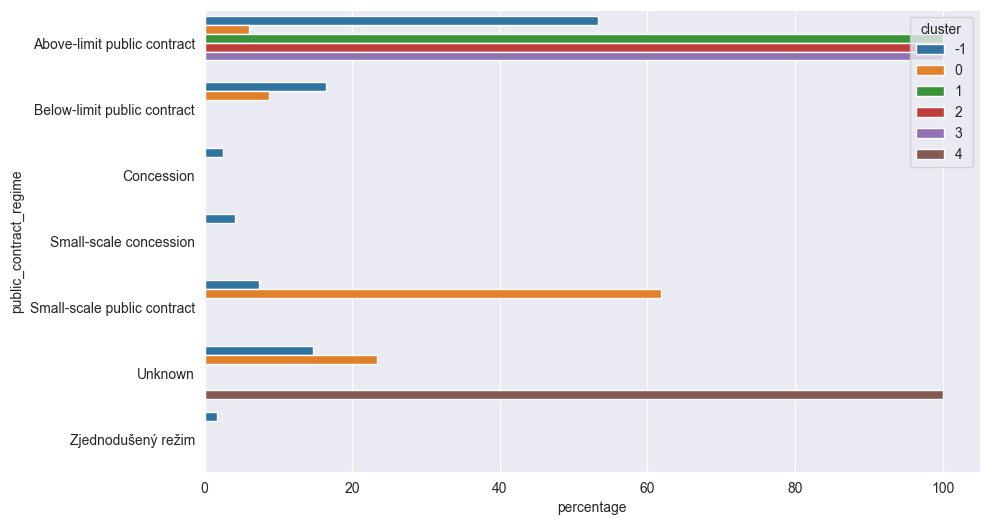

In [237]:
# Calculate the percentages
percentages = correct_for_DBSCAN.groupby(['cluster', 'public_contract_regime']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='percentage', y='public_contract_regime', hue='cluster')

<Axes: xlabel='percentage', ylabel='type_of_procedure'>

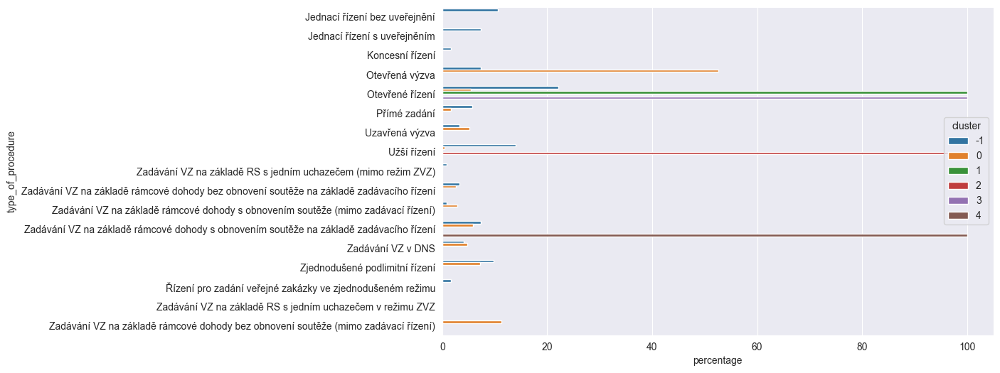

In [238]:
percentages = correct_for_DBSCAN.groupby(['cluster', 'type_of_procedure']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='percentage', y='type_of_procedure', hue='cluster')

<Axes: xlabel='cluster', ylabel='percentage'>

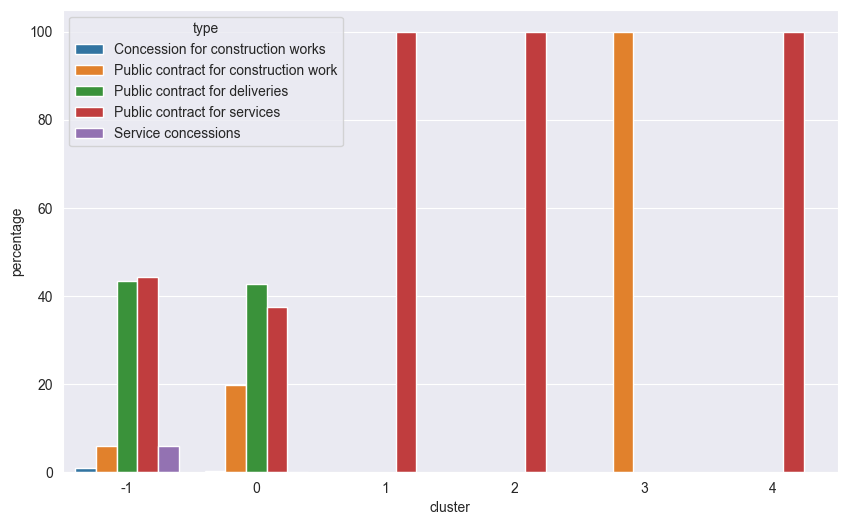

In [239]:
percentages = correct_for_DBSCAN.groupby(['cluster', 'type']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='cluster', y='percentage', hue='type')

<Axes: xlabel='percentage', ylabel='place_of_performance'>

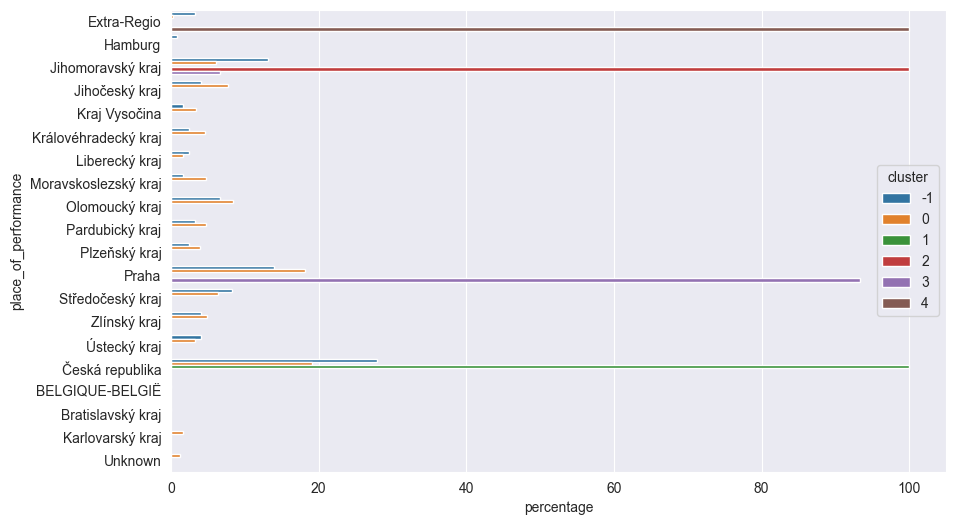

In [240]:
percentages = correct_for_DBSCAN.groupby(['cluster', 'place_of_performance']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='percentage', y='place_of_performance', hue='cluster')

In [241]:
import plotly.graph_objects as go

In [242]:
correct_for_DBSCAN

,is_association_of_suppliers,is_rejected_due_too_low,is_withdrawn,price,price_vat,number_of_offers,contract_price,contract_price_vat,contract_price_with_amendments,contract_price_with_amendments_vat,...,type_of_procedure,publication_close_interval,bids_close_interval,total_offers,total_wins,total_procurements,distance,num_of_nan,codes,cluster
0,False,False,False,145972.50,174756.165,9,498667.40,603387.55,498667.40,603387.55,...,Otevřená výzva,27.0,10.0,443,158,73,nan,3,48,0
1,False,False,False,1240.00,1500.400,1,496000.00,600160.00,496000.00,600160.00,...,Uzavřená výzva,-1.0,12.0,1,0,43,nan,5,92,0
2,False,False,False,1127737.93,1364562.900,5,1541000.00,1864610.00,1541000.00,1864610.00,...,Otevřená výzva,29.0,9.0,57,10,157,"[15,50)",0,30,0
3,False,False,False,1130481.83,1367883.010,5,1541000.00,1864610.00,1541000.00,1864610.00,...,Otevřená výzva,29.0,9.0,5,2,157,"[15,50)",0,30,0
5,False,False,False,109615.88,132635.210,1,109615.88,132635.21,109615.88,132635.21,...,Přímé zadání,-7.0,12.0,1,1,43,nan,4,50,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9491,False,False,False,156075.20,188850.990,4,155763.50,188473.84,155763.50,188473.84,...,Zadávání VZ v DNS,-2.0,12.0,66,32,349,nan,3,30,0
9492,False,False,False,145972.50,174756.165,1,400000.00,484000.00,400000.00,484000.00,...,Otevřené řízení,40.0,27.0,1,0,3,nan,3,79,0
9497,False,False,False,206543.78,249917.970,3,173665.00,210134.65,173665.00,210134.65,...,Otevřená výzva,20.0,9.0,92,18,425,"[100,+inf)",0,39,0
9498,False,False,False,140011.70,177230.000,4,87597.07,105992.45,87597.07,105992.45,...,Otevřená výzva,26.0,15.0,1,0,425,"[50,100)",2,31,0


In [243]:
dictionary_places = {
    'Ústecký kraj': 'ULK',
    'Karlovarský kraj': 'KVK',
    'Plzeňský kraj': 'PLK',
    'Jihočeský kraj': 'JCK',
    'Praha': 'PHA',
    'Středočeský kraj': 'SCK',
    'Kraj Vysočina': 'VYN',
    'Jihomoravský kraj': 'JHM',
    'Olomoucký kraj': 'OLK',
    'Zlínský kraj': 'ZLK',
    'Moravskoslezský kraj': 'MSK',
    'Královéhradecký kraj': 'KHK',
    'Pardubický kraj': 'PAK',
    'Liberecký kraj': 'LBK',
    'Česká republika': 'CZE',
    'unknown': 'UNK',
    'Zahraničí': 'FOR'
}
# apply dictionary to place of performance if there is no such key in dictionary return 'FOR'
correct_for_DBSCAN['place_of_performance'] = correct_for_DBSCAN['place_of_performance'].apply(lambda x: dictionary_places.get(x, 'FOR'))
wrong_for_DBSCAN['place_of_performance'] = wrong_for_DBSCAN['place_of_performance'].apply(lambda x: dictionary_places.get(x, 'FOR'))

In [244]:
correct_for_DBSCAN.sort_values(by='price', ascending=False)

,is_association_of_suppliers,is_rejected_due_too_low,is_withdrawn,price,price_vat,number_of_offers,contract_price,contract_price_vat,contract_price_with_amendments,contract_price_with_amendments_vat,...,type_of_procedure,publication_close_interval,bids_close_interval,total_offers,total_wins,total_procurements,distance,num_of_nan,codes,cluster
832,False,False,False,1.145797e+11,1.386414e+11,9,42951256.5,51971014.50,42951256.5,51971014.50,...,Zjednodušené podlimitní řízení,93.0,22.0,11,1,16,"[0,15)",0,45,0
925,False,False,False,1.130746e+11,1.368203e+11,9,42951256.5,51971014.50,42951256.5,51971014.50,...,Zjednodušené podlimitní řízení,93.0,22.0,5,0,16,"[0,15)",0,45,0
853,False,False,False,1.108713e+11,1.341542e+11,9,42951256.5,51971014.50,42951256.5,51971014.50,...,Zjednodušené podlimitní řízení,93.0,22.0,38,14,16,"[0,15)",0,45,0
2202,False,False,False,9.370252e+10,1.133800e+11,13,2214974.4,2680241.60,2214974.4,2680241.60,...,Zjednodušené podlimitní řízení,105.0,19.0,7,0,6,"[100,+inf)",0,79,0
5609,False,False,False,9.360000e+08,1.132560e+09,3,441324.0,534000.00,441324.0,534000.00,...,Otevřená výzva,54.0,14.0,323,15,14171,"[50,100)",0,39,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8854,False,False,False,0.000000e+00,0.000000e+00,1,18750.0,18750.00,18750.0,18750.00,...,Zadávání VZ na základě rámcové dohody bez obno...,-729.0,12.0,11,9,14171,nan,4,35,0
3978,False,False,False,0.000000e+00,0.000000e+00,1,29350.0,29350.00,29350.0,29350.00,...,Zadávání VZ na základě rámcové dohody bez obno...,-195.0,12.0,1,0,14171,nan,6,85,0
3980,False,False,False,0.000000e+00,0.000000e+00,1,23900.0,23900.00,23900.0,23900.00,...,Zadávání VZ na základě rámcové dohody bez obno...,-195.0,12.0,1,0,14171,nan,6,85,0
2215,False,False,False,0.000000e+00,0.000000e+00,1,358550.0,433845.50,358550.0,433845.50,...,Zadávání VZ na základě rámcové dohody bez obno...,-7.0,12.0,77,65,86,nan,4,39,0


In [245]:
list(correct_for_DBSCAN['place_of_performance'].unique())

['PHA',
 'CZE',
 'FOR',
 'OLK',
 'ZLK',
 'JCK',
 'SCK',
 'ULK',
 'PAK',
 'JHM',
 'PLK',
 'KHK',
 'MSK',
 'KVK',
 'LBK',
 'VYN']

In [246]:
import plotly.express as px

In [247]:
fig = px.sunburst(correct_for_DBSCAN, path=['type', 'type_of_procedure', 'place_of_performance'], values='contract_price')
fig.show()

In [248]:
fig = px.box(correct_for_DBSCAN, x="contract_price")
fig.update_traces(boxpoints=False) 
fig.show()

In [249]:
fig = px.histogram(correct_for_DBSCAN, x="contract_price", color="cluster",
                   marginal="violin", # or violin, rug
                   hover_data=correct_for_DBSCAN.columns)
fig.show()

In [250]:
# for each company_id compute true winratio, predicted winratio and overall contract_price_of wins
companies = X_test_all['company_id'].unique()
companies_winratio = {}
for company in companies:
    company_data = X_test_all[X_test_all['company_id'] == company]
    true_winratio = company_data[company_data['is_winner'] == 'True'].shape[0] / company_data.shape[0]
    predicted_winratio = company_data[company_data['predictions'] == 'True'].shape[0] / company_data.shape[0]
    contract_price_of_wins = company_data[company_data['is_winner'] == 'True']['contract_price'].sum()
    companies_winratio[company] = [true_winratio, predicted_winratio, contract_price_of_wins]

In [251]:
df = pd.DataFrame(companies_winratio).T

In [252]:
df.rename(columns={0: 'true_winratio', 1: 'predicted_winratio', 2: 'contract_price_of_wins'}, inplace=True)

In [253]:
fig = px.scatter(df, x="true_winratio", y="predicted_winratio",
	         size="contract_price_of_wins", size_max=60, hover_name=df.index)
fig.show()

In [254]:
# profile = ProfileReport(correct_for_DBSCAN[correct_for_DBSCAN['cluster'] == -1], title="Outliers_correct")
# profile.to_file("Outliers_correct.html")

In [255]:
# profile = ProfileReport(wrong_for_DBSCAN[wrong_for_DBSCAN['cluster'] == -1], title="Outliers_wrong")
# profile.to_file("Outliers_wrong.html")

In [256]:
wrong_for_DBSCAN['cluster'].replace({-1 : -2, 0 : 10, 1 : 11, 3 : 13}, inplace=True)

In [257]:
clusters_all = pd.concat([correct_for_DBSCAN, wrong_for_DBSCAN])

In [258]:
clusters_all['cluster'].value_counts()

cluster
 0     7423
 2      933
-2      776
-1      122
 11      88
 13      79
 10      31
 1       17
 4       16
 3       15
Name: count, dtype: int64

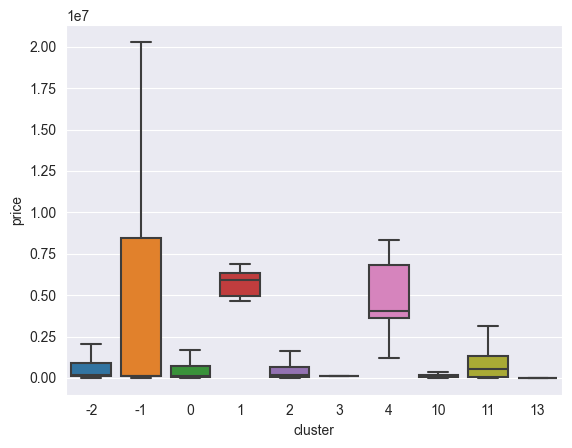

In [259]:
sns.boxplot(data=clusters_all, y='price', x='cluster', showfliers=False)
plt.show()

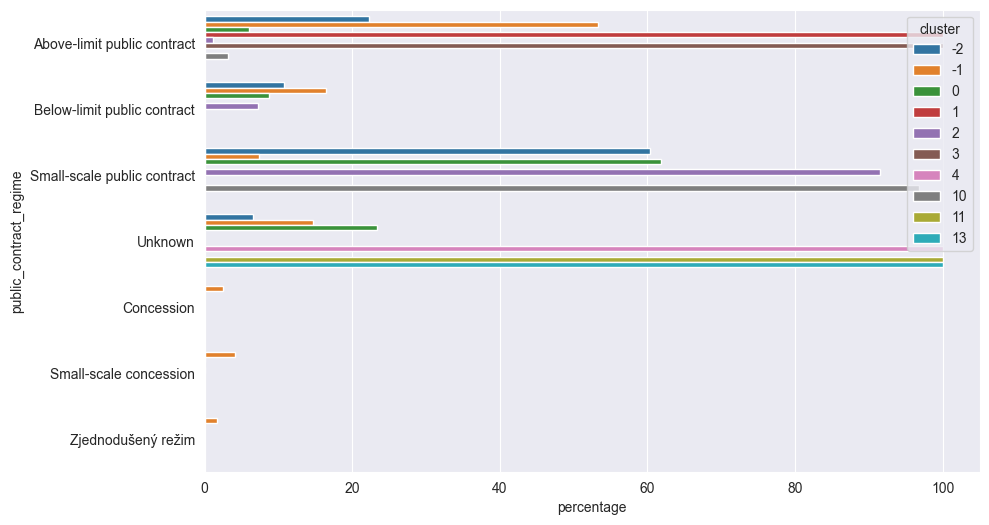

In [260]:
percentages = clusters_all.groupby(['cluster', 'public_contract_regime']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='percentage', y='public_contract_regime', hue='cluster')
plt.show()

<Axes: xlabel='percentage', ylabel='type'>

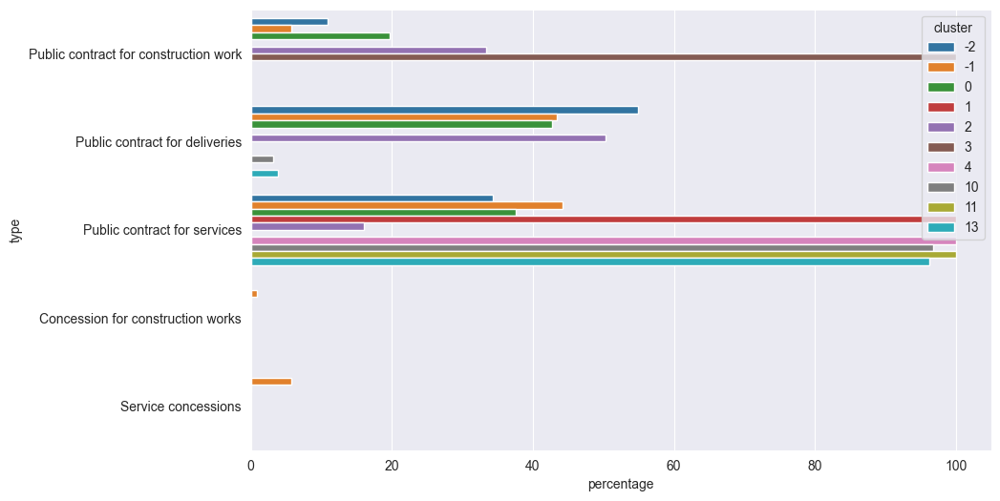

In [261]:
percentages = clusters_all.groupby(['cluster', 'type']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='percentage', y='type', hue='cluster')

In [262]:
clusters_all.groupby('cluster')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
-2,776.0,5.239745e+06,3.537763e+07,0.01,1.093952e+05,201600.00,8.996377e+05,7.871600e+08
-1,122.0,2.870144e+07,9.271370e+07,0.00,1.459725e+05,145972.50,8.459656e+06,7.871600e+08
0,7423.0,6.012614e+07,2.515420e+09,0.00,2.722300e+04,145972.50,6.942705e+05,1.145797e+11
1,17.0,5.596399e+06,1.111922e+06,2258000.00,4.947173e+06,5888888.00,6.328000e+06,6.894900e+06
2,933.0,1.293516e+06,4.594088e+06,135.45,5.913600e+04,201600.00,6.788000e+05,7.989050e+07
3,15.0,1.459725e+05,0.000000e+00,145972.50,1.459725e+05,145972.50,1.459725e+05,1.459725e+05
4,16.0,4.914435e+06,2.984608e+06,1185000.00,3.593750e+06,4052293.00,6.835126e+06,1.305600e+07
10,31.0,1.519505e+05,1.387916e+05,1800.00,5.017750e+04,117720.00,2.016000e+05,5.342040e+05
11,88.0,7.245146e+05,7.725237e+05,46.96,4.041506e+04,542367.83,1.300740e+06,3.121800e+06


<Axes: xlabel='cluster', ylabel='percentage'>

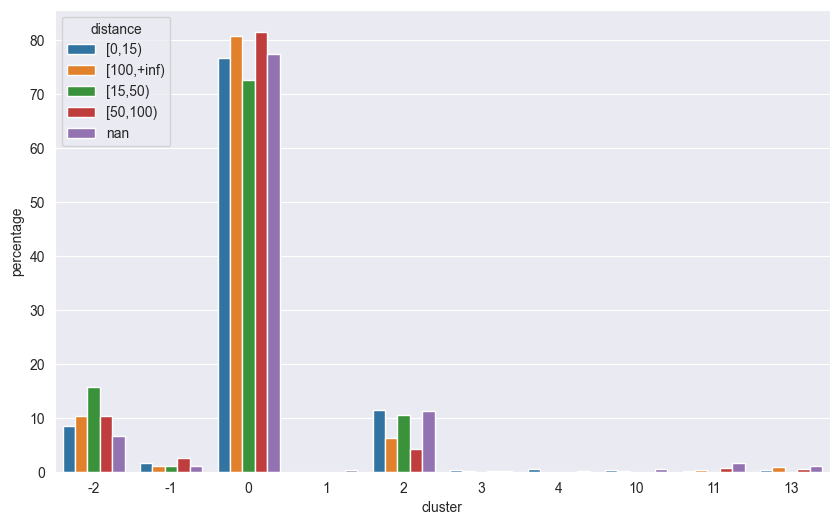

In [263]:
percentages = clusters_all.groupby(['cluster', 'distance']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('distance')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, y='percentage', x='cluster', hue='distance')

<Axes: xlabel='percentage', ylabel='distance'>

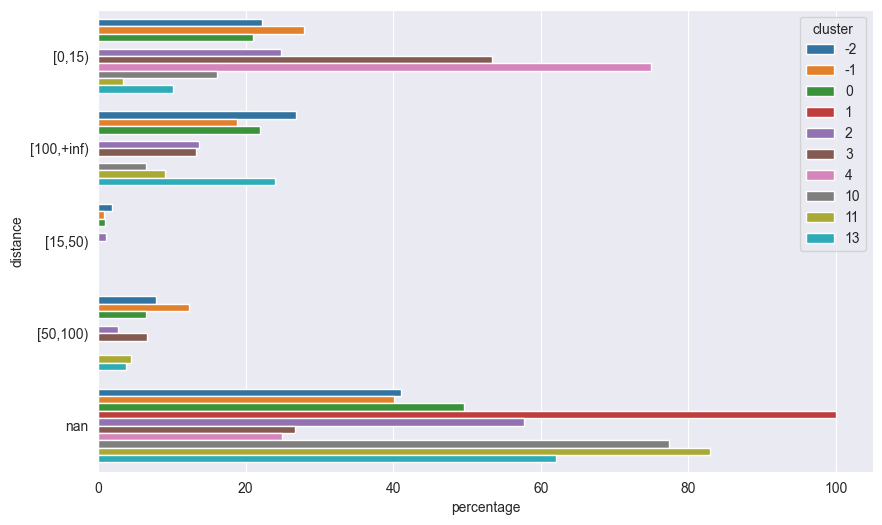

In [264]:
percentages = clusters_all.groupby(['cluster', 'distance']).size().reset_index(name='count')
percentages['percentage'] = percentages.groupby('cluster')['count'].transform(lambda x: x / x.sum() * 100)

plt.figure(figsize=(10, 6))
sns.barplot(data=percentages, x='percentage', y='distance', hue='cluster')

In [265]:
clusters_all

,is_association_of_suppliers,is_rejected_due_too_low,is_withdrawn,price,price_vat,number_of_offers,contract_price,contract_price_vat,contract_price_with_amendments,contract_price_with_amendments_vat,...,publication_close_interval,bids_close_interval,total_offers,total_wins,total_procurements,distance,num_of_nan,codes,cluster,code_from_nipez_codelist
0,False,False,False,145972.50,174756.165,9,498667.40,603387.55,498667.40,603387.55,...,27.0,10.0,443,158,73,nan,3,48,0,NaN
1,False,False,False,1240.00,1500.400,1,496000.00,600160.00,496000.00,600160.00,...,-1.0,12.0,1,0,43,nan,5,92,0,NaN
2,False,False,False,1127737.93,1364562.900,5,1541000.00,1864610.00,1541000.00,1864610.00,...,29.0,9.0,57,10,157,"[15,50)",0,30,0,NaN
3,False,False,False,1130481.83,1367883.010,5,1541000.00,1864610.00,1541000.00,1864610.00,...,29.0,9.0,5,2,157,"[15,50)",0,30,0,NaN
5,False,False,False,109615.88,132635.210,1,109615.88,132635.21,109615.88,132635.21,...,-7.0,12.0,1,1,43,nan,4,50,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9487,False,False,False,155763.50,188473.840,4,155763.50,188473.84,155763.50,188473.84,...,-2.0,12.0,44,21,349,nan,3,30,2,30190000-7
9493,False,False,True,201600.00,232320.000,2,2160000.00,2613600.00,2160000.00,2613600.00,...,44.0,16.0,7,2,24,"[100,+inf)",2,45,2,45000000-7
9494,False,False,False,851000.00,232320.000,2,1100000.00,1331000.00,1100000.00,1331000.00,...,17.0,12.0,1,0,79,"[15,50)",3,45,-2,45330000-9
9495,True,False,False,108106.10,130808.380,4,108106.10,130808.38,108106.10,130808.38,...,20.0,9.0,45,21,14171,nan,1,31,2,31500000-1


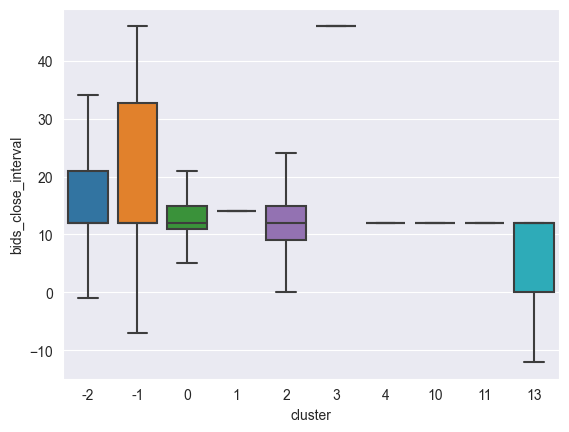

In [266]:
sns.boxplot(data=clusters_all, y='bids_close_interval', x='cluster', showfliers=False)
plt.show()

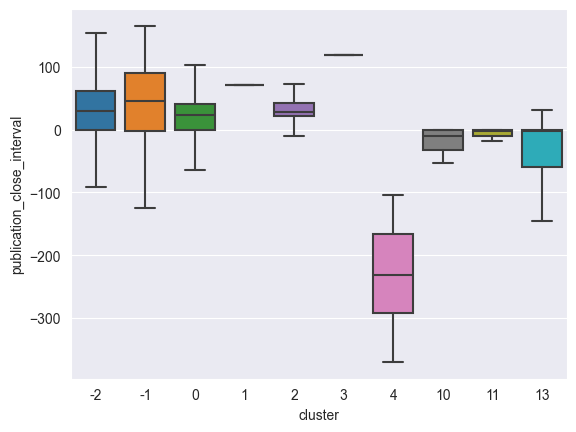

In [267]:
sns.boxplot(data=clusters_all, y='publication_close_interval', x='cluster', showfliers=False)
plt.show()

In [268]:
from sklearn.ensemble import IsolationForest

In [269]:
Iforest = IsolationForest(contamination=0.1)

In [270]:
correct_for_DBSCAN['outliers'] = Iforest.fit_predict(correct_for_DBSCAN[['price', 'price_vat', 'bids_close_interval', 'publication_close_interval', 'total_offers', 'total_wins', 'total_procurements', 'number_of_offers', 'num_of_nan']])

In [271]:
correct_for_DBSCAN.groupby('outliers')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
outliers,,,,,,,,
-1,761.0,5.836909e+08,7.841369e+09,0.0,64390.000,269796.12,13056000.0,1.145797e+11
1,6843.0,8.485666e+05,2.203869e+06,0.0,26743.445,145972.50,607941.0,2.738452e+07


In [272]:
wrong_for_DBSCAN['outliers'] = Iforest.fit_predict(wrong_for_DBSCAN[['price', 'price_vat', 'bids_close_interval', 'publication_close_interval', 'total_offers', 'total_wins', 'total_procurements', 'number_of_offers', 'num_of_nan']])

In [273]:
wrong_for_DBSCAN.groupby('outliers')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
outliers,,,,,,,,
-1,190.0,2.106134e+07,6.977906e+07,273.00,73151.25,569734.735,1.361784e+07,7.871600e+08
1,1706.0,7.847849e+05,2.028217e+06,0.01,53563.50,201600.000,6.113429e+05,2.684717e+07
